In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as patches

In [2]:
df = pd.read_csv("Datensammlung.csv")

C:\Users\denni\AppData\Local\Temp\ipykernel_17760\165009908.py:1: DtypeWarning: Columns (1,29) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("Datensammlung.csv")


In [ ]:
#the second dataframe combines the CDU and CSU
df2 = pd.read_csv("Datensammlung.csv")
df2.loc[df2['Fraktion oder Gruppe (Partei)'] == 'CDU/CSU (CDU)', 'Fraktion oder Gruppe (Partei)'] = 'CDU/CSU'
df2.loc[df2['Fraktion oder Gruppe (Partei)'] == 'CDU/CSU (CSU)', 'Fraktion oder Gruppe (Partei)'] = 'CDU/CSU'

C:\Users\denni\AppData\Local\Temp\ipykernel_17760\3604901276.py:1: DtypeWarning: Columns (1,29) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv("Datensammlung.csv")


In [ ]:
#df = pd.read_csv("../Topic_Modeling/begrenzte_Datensammlung.csv", encoding="utf-8")

Creating party specific dataframes

In [4]:
gruene = pd.DataFrame(df[(df == 'Grüne').any(axis=1)])
spd = pd.DataFrame(df[(df == 'SPD').any(axis=1)])
cdu = pd.DataFrame(df[(df == 'CDU/CSU (CDU)').any(axis=1)])
csu = pd.DataFrame(df[(df == 'CDU/CSU (CSU)').any(axis=1)])
cdu_csu = pd.DataFrame(df2[(df2 == 'CDU/CSU').any(axis=1)])
fdp = pd.DataFrame(df[(df == 'FDP').any(axis=1)])
afd = pd.DataFrame(df[(df == 'AfD').any(axis=1)])
linke = pd.DataFrame(df[(df == 'Die Linke').any(axis=1)])
fraktionslos = pd.DataFrame(df[(df == 'fraktionslos').any(axis=1)])
bsw = pd.DataFrame(df[(df == 'BSW').any(axis=1)])

Creating year specific dataframes 

In [5]:
sentiment_counts = df.groupby(["Jahr", "Monat", "Sentiment"]).size().unstack(fill_value=0)
sentiment_counts["Total"] = sentiment_counts.sum(axis=1)

In [6]:
Jahr_2021 = sentiment_counts.loc[2021.0]
Jahr_2022 = sentiment_counts.loc[2022.0]
Jahr_2023 = sentiment_counts.loc[2023.0]
Jahr_2024 = sentiment_counts.loc[2024.0]
Jahr_2025 = sentiment_counts.loc[2025.0]

Defining essential variables and functions

In [7]:
tage_30 = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,  12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
tage_31 = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,  12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]
ampelbruch = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,  12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
               25, 26, 27, 28, 29, 30, 31, #Oktober
              1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,  12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, #November
              1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,  12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31] #Dezember
custom_colors = ['#ae0849', '#fea712', '#67b345'] #negativ, neutral, positiv
monate = ['January', 'February', 'March', 'April', 'May', 'June',
          'July', 'August', 'September', 'October', 'November', 'December']
monate2 = ['January', 'February']
testmonate = ['01.2021', '02.2021', '03.2021', '04.2021', '05.2021', '06.2021', '07.2021', '08.2021', '09.2021', '10.2021', '11.2021', '12.2021',
              '01.2022', '02.2022', '03.2022', '04.2022', '05.2022', '06.2022', '07.2022', '08.2022', '09.2022', '10.2022', '11.2022', '12.2022',
              '01.2023', '02.2023', '03.2023', '04.2023', '05.2023', '06.2023', '07.2023', '08.2023', '09.2023', '10.2023', '11.2023', '12.2023',
              '01.2024', '02.2024', '03.2024', '04.2024', '05.2024', '06.2024', '07.2024', '08.2024', '09.2024', '10.2024', '11.2024', '12.2024',
              '01.2025', '02.2025']
custom_colors_parteien = ["#e0001a", #SPD
                          "#000000", #CDU
                          "#1AA037", #Grüne
                          "#FFEF00", #FDP
                          "#0489DB", #AfD
                          "#0570C9", #CSU
                          "#bc2f74", #Linke
                          "#6F003C", #Fraktionslos
                          "#ffa500"  #BSW
                          ] 
custom_colors_parteien_cdu_csu = ["#e0001a", #SPD
                          "#000000", #CDU/CSU
                          "#1AA037", #Grüne
                          "#FFEF00", #FDP
                          "#0489DB", #AfD
                          "#bc2f74", #Linke
                          "#6F003C", #Fraktionslos
                          "#ffa500"  #BSW
                          ] 

#oder für Linke #bc2f74 (->Jessi) #SPD alt #E3000F
#SPD, CDU, Grüne, FDP, AfD, CSU, Linke (#0570C9 ), Fraktionslos (orange), BSW
partei_farben = {"SPD": "#e0001a", "CDU": "#000000", "Grüne": "#1AA037", "FDP": "#FFEF00", "AfD": "#0489DB", "CSU": "#0570C9", "Linke": "#bc2f74", "Fraktionslos": "#6F003C", "BSW": "#ffa500"}

Calculating the mean-sentiment by subtracting the number of negative posts from the number of positive posts and dividing the result through the total number of posts

In [8]:
def Zwischenwert (row):
    ergebnis = ((row.negative * (-1)) + (row.positive * 1))/row.Total
    ergebnis = round(ergebnis, 2)
    return ergebnis

Functions for the party specific sentiment in absolute numbers

In [12]:
def graph_jahr(data, titel, jahr):
    ax = data.plot(kind="line", stacked=False, figsize=(10,6), color=custom_colors_parteien_cdu_csu)

    ax.set_xticks(range(1, 13, 1))
    ax.set_xticklabels(monate)
    ax.set_yticks(range(0, 6500, 500))
    # ax.set_yticks(range(0, 4000, 200))

    plt.xlabel("Months in " + str(jahr))
    plt.ylabel("Number of Posts")
    plt.title(titel)
    plt.legend(title="Sentiment", bbox_to_anchor=(1.0, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle=':', linewidth=0.5)

    plt.savefig('../Outputs/graph_jahr/graph_' + str(titel) + '_' + str(jahr) + '.png', bbox_inches='tight')
    plt.show()

def graph_2025(data, titel):
    ax = data.plot(kind="line", stacked=False, figsize=(10,6), color=custom_colors_parteien_cdu_csu)

    ax.set_xticks(range(1, 3, 1))
    ax.set_xticklabels(monate2)
    ax.set_yticks(range(0, 6500, 500))

    plt.xlabel("Months in 2025")
    plt.ylabel("Number of Posts")
    plt.title(titel)
    plt.legend(title="Sentiment", bbox_to_anchor=(1.0, 1), loc='upper left')
    plt.grid(True, which='both', linestyle=':', linewidth=0.5)

    plt.savefig('../Outputs/graph_jahr/graph_' + str(titel) + '.png', bbox_inches='tight')
    plt.show()


def graph_2024_25 (data1, data2, titel):
    data = pd.concat([data1, data2], ignore_index=True)
    ax = data.plot(kind="line", stacked=False, figsize=(10,6), color=custom_colors_parteien_cdu_csu)

    ax.set_xticks(range(0, 14, 1))
    ax.set_xticklabels(['January', 'February', 'March', 'April', 'Mai', 'June',
                         'July', 'August', 'September', 'October', 'November', 'December', 'January', 'February'])
    
    ax.set_yticks(range(0, 6500, 500))

    plt.xlabel("Months in 2024 und 2025")
    plt.ylabel("Number of Posts")
    plt.title(titel)
    plt.legend(title="Sentiment", bbox_to_anchor=(1.0, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle=':', linewidth=0.5)

    plt.savefig('../Outputs/graph_jahr/graph_2024_25.png', bbox_inches='tight')
    plt.show()


def long_graph (data, titel):
    ax = data.plot(kind="line", stacked=False, figsize=(21,6), color=custom_colors_parteien_cdu_csu)

    ax.set_xticks(range(0, 50, 1))
    ax.set_xticklabels(testmonate)
    ax.set_yticks(range(0, 6500, 500))

    plt.xlabel("Months in 2021 und 2025")
    plt.ylabel("Number of Posts")
    plt.title(titel)
    plt.legend(title="Sentiment", bbox_to_anchor=(1.0, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle=':', linewidth=0.5)

    plt.xlim(0, 49)

    plt.vlines(x=8, colors='red', ymin= 0, ymax= 6500, alpha=0.5, ls=':', lw=2, label='September 2021')
    plt.vlines(x=46,  colors='red', ymin=0, ymax=6500, alpha=0.5, ls=':', lw=2, label='November 2024')
    plt.vlines(x=12, colors='grey', ymin= 0, ymax=6500, alpha=0.5, ls=':', lw=2, label='Beginning 2022')
    plt.vlines(x=24,  colors='grey', ymin=0, ymax=6500, alpha=0.5, ls=':', lw=2, label='Beginning 2023')
    plt.vlines(x=36, colors='grey', ymin= 0, ymax=6500, alpha=0.5, ls=':', lw=2, label='Beginning 2024')
    plt.vlines(x=48,  colors='grey', ymin=0, ymax=6500, alpha=0.5, ls=':', lw=2, label='Beginning 2025')

    plt.savefig('../Outputs/long_graph/long_graph_' + str(titel) + '.png', bbox_inches='tight')
    plt.show()



Functions for the party specific mean-sentiment

In [30]:
def graph_jahr_parteien(data, titel, jahr, farbe):
    ax = data.plot(kind="line", stacked=False, figsize=(10,6), color=farbe)

    ax.set_xticks(range(1, 13, 1))
    ax.set_xticklabels(monate)
    ax.set_yticks(np.arange(-1, 1, 0.1))
    #ax.set_yticks(range(-1, 1, 0.1))

    plt.xlabel("Months in " + str(jahr))
    plt.ylabel("Mean-Sentiment per Month")
    plt.title(titel)
    plt.legend(title="Sentiment", bbox_to_anchor=(1.0, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle=':', linewidth=0.5)

    plt.xlim(1, 12)
    ax.axhline(y=0, color = "grey",  alpha=0.7)


    plt.savefig('../Outputs/graph_jahr_parteien/graph_parteien_' + str(titel) + '.png', bbox_inches='tight')
    plt.show()

def graph_2024_2025_parteien(data, titel, farbe):
    ax = data.plot(kind="line", stacked=False, figsize=(10,6), color=farbe)

    ax.set_xticks(range(0, 14, 1))
    ax.set_xticklabels(['January', 'February', 'March', 'April', 'Mai', 'June',
                         'July', 'August', 'September', 'October', 'November', 'December', 
                         'January', 'February'])
    ax.set_yticks(np.arange(-1, 1, 0.1))
    #ax.set_yticks(range(-1, 1, 0.1))
    #range(0, 4200, 200)
    plt.xlim(0, 13)
    
    ax.axhline(y=0, color = "grey",  alpha=0.7)

    plt.xlabel("Months in 2024 and 2025")
    plt.ylabel("Mean-Sentiment per Month")
    plt.title(titel)
    plt.legend(title="Sentiment", bbox_to_anchor=(1.0, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle=':', linewidth=0.5)

    plt.savefig('../Outputs/graph_jahr_parteien/graph_parteien_2024_25.png', bbox_inches='tight')
    plt.show()

def long_graph_parteien (data, titel, farbe):
    ax = data.plot(kind="line", stacked=False, figsize=(21,6), color=farbe)

    ax.set_xticks(range(0, 50, 1))
    ax.set_xticklabels(testmonate)
    ax.set_yticks(np.arange(-1, 1, 0.1))
    ax.axhline(y=0, color = "grey",  alpha=0.7)
    #ax.set_yticks(range(-1, 1, 0.1))

    plt.vlines(x=8, colors='red', ymin= -0.9, ymax=0.95, alpha=0.5, ls=':', lw=2, label='September 2021')
    plt.vlines(x=46,  colors='red', ymin=-0.9, ymax=0.95, alpha=0.5, ls=':', lw=2, label='November 2024')
    plt.vlines(x=12, colors='grey', ymin= -0.9, ymax=0.95, alpha=0.5, ls=':', lw=2, label='Beginning 2022')
    plt.vlines(x=24,  colors='grey', ymin=-0.9, ymax=0.95, alpha=0.5, ls=':', lw=2, label='Beginning 2023')
    plt.vlines(x=36, colors='grey', ymin= -0.9, ymax=0.95, alpha=0.5, ls=':', lw=2, label='Beginning 2024')
    plt.vlines(x=48,  colors='grey', ymin=-0.9, ymax=0.95, alpha=0.5, ls=':', lw=2, label='Beginning 2025')


    plt.xlabel("Months between January 2021 and February 2025")
    plt.ylabel("Mean-Sentiment per Month")
    plt.title(titel)
    plt.legend(title="Sentiment", bbox_to_anchor=(1.0, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle=':', linewidth=0.5)

    plt.xlim(0, 49)

    plt.savefig('../Outputs/long_graph_parteien/long_graph_parteien' + str(titel) + '.png', bbox_inches='tight')
    
    plt.show()


def tage_im_monat(data, titel, monat, jahr, tage, farbe, ende):
    ax = data.plot(kind="line", stacked=False, figsize=(18,6), color=farbe)

    ax.set_xticks(tage)
    ax.set_xticklabels(tage)
    ax.set_yticks(np.arange(-1, 1, 0.1))
    
    ax.axhline(y=0, color = "grey",  alpha=0.7)

    plt.xlabel("Days in " + str(monat) + ' '+  str(jahr))
    plt.ylabel("Mean-Sentiment per Day")
    plt.title(titel)
    plt.legend(title="Sentiment", bbox_to_anchor=(1.0, 1), loc='upper left')
    #plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle=':', linewidth=0.5)
    plt.xlim(0, max(tage))

    plt.xlim(1, ende)
    

    plt.savefig('../Outputs/graph_monat_parteien/graph_' + str(monat) + '_'+ str(jahr) + '.png', bbox_inches='tight')
    plt.show()


def Ampelbruch(data):
    ax = data.plot(kind="line", stacked=False, figsize=(21,6), color=custom_colors_parteien_cdu_csu)
    
    ax.set_xticks(range(0, 92 ,1))
    
    ax.set_xticklabels(ampelbruch)
    ax.set_yticks(np.arange(-1, 1, 0.1))
    
    ax.axhline(y=0, color = "grey",  alpha=0.8)

    plt.xlabel("Days between October and December 2024")
    plt.ylabel("Mean-Sentiment per Day")
    plt.title("Relative Sentiment of all Parties from October to December 2024")
    plt.legend(title="Sentiment", bbox_to_anchor=(1.0, 1), loc='upper left')
    #plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle=':', linewidth=0.5)

    plt.vlines(x=31, colors='grey', ymin= -1, ymax=0.95, alpha=0.5, ls=':', lw=2, label='November 2024')
    plt.vlines(x=61, colors='grey', ymin= -1, ymax=0.95, alpha=0.5, ls=':', lw=2, label='December 2024')

    plt.xlim(0, 91)
    plt.ylim(-1, 1)

    rect_oct = patches.Rectangle((0, -1), 31, 2, facecolor='#e0ffff', alpha=0.3)
    ax.add_patch(rect_oct)
    rect_nov = patches.Rectangle((31, -1), 61, 2, facecolor='#fff0f5', alpha=0.5)
    ax.add_patch(rect_nov)
    rect_dec = patches.Rectangle((61, -1), 91, 2, facecolor='#9acd32', alpha=0.07)
    ax.add_patch(rect_dec)
##ffefdb    #ffe4e1
    plt.tight_layout()

    plt.savefig('../Outputs/ampelbruch.png', bbox_inches='tight')
    plt.show()

In [14]:
#### Grüne ####

gruene_sentiment_counts = gruene.groupby(["Jahr", "Monat", "Sentiment"]).size().unstack(fill_value=0)
gruene_sentiment_counts["Total"] = gruene_sentiment_counts.sum(axis=1)

g_Jahr_2021 = gruene_sentiment_counts.loc[2021.0]
g_Jahr_2022 = gruene_sentiment_counts.loc[2022.0]
g_Jahr_2023 = gruene_sentiment_counts.loc[2023.0]
g_Jahr_2024 = gruene_sentiment_counts.loc[2024.0]
g_Jahr_2025 = gruene_sentiment_counts.loc[2025.0]

g_vertical_concat = pd.concat([g_Jahr_2021, g_Jahr_2022, g_Jahr_2023, g_Jahr_2024, g_Jahr_2025], axis=0, ignore_index=True)


#### CDU ####

cdu_sentiment_counts = cdu.groupby(["Jahr", "Monat", "Sentiment"]).size().unstack(fill_value=0)
cdu_sentiment_counts["Total"] = cdu_sentiment_counts.sum(axis=1)

cdu_Jahr_2021 = cdu_sentiment_counts.loc[2021.0]
cdu_Jahr_2022 = cdu_sentiment_counts.loc[2022.0]
cdu_Jahr_2023 = cdu_sentiment_counts.loc[2023.0]
cdu_Jahr_2024 = cdu_sentiment_counts.loc[2024.0]
cdu_Jahr_2025 = cdu_sentiment_counts.loc[2025.0]

cdu_vertical_concat = pd.concat([cdu_Jahr_2021, cdu_Jahr_2022, cdu_Jahr_2023, cdu_Jahr_2024, cdu_Jahr_2025], axis=0, ignore_index=True)


#### CDU/CSU ####

cdu_csu_sentiment_counts = cdu_csu.groupby(["Jahr", "Monat", "Sentiment"]).size().unstack(fill_value=0)
cdu_csu_sentiment_counts["Total"] = cdu_csu_sentiment_counts.sum(axis=1)

cdu_csu_Jahr_2021 = cdu_csu_sentiment_counts.loc[2021.0]
cdu_csu_Jahr_2022 = cdu_csu_sentiment_counts.loc[2022.0]
cdu_csu_Jahr_2023 = cdu_csu_sentiment_counts.loc[2023.0]
cdu_csu_Jahr_2024 = cdu_csu_sentiment_counts.loc[2024.0]
cdu_csu_Jahr_2025 = cdu_csu_sentiment_counts.loc[2025.0]

cdu_csu_vertical_concat = pd.concat([cdu_csu_Jahr_2021, cdu_csu_Jahr_2022, cdu_Jahr_2023, cdu_csu_Jahr_2024, cdu_csu_Jahr_2025], axis=0, ignore_index=True)


#### CSU ####

csu_sentiment_counts = csu.groupby(["Jahr", "Monat", "Sentiment"]).size().unstack(fill_value=0)
csu_sentiment_counts["Total"] = csu_sentiment_counts.sum(axis=1)

csu_Jahr_2021 = csu_sentiment_counts.loc[2021.0]
csu_Jahr_2022 = csu_sentiment_counts.loc[2022.0]
csu_Jahr_2023 = csu_sentiment_counts.loc[2023.0]
csu_Jahr_2024 = csu_sentiment_counts.loc[2024.0]
csu_Jahr_2025 = csu_sentiment_counts.loc[2025.0]

csu_vertical_concat = pd.concat([csu_Jahr_2021, csu_Jahr_2022, csu_Jahr_2023, csu_Jahr_2024, csu_Jahr_2025], axis=0, ignore_index=True)


#### SPD ####

spd_sentiment_counts = spd.groupby(["Jahr", "Monat", "Sentiment"]).size().unstack(fill_value=0)
spd_sentiment_counts["Total"] = spd_sentiment_counts.sum(axis=1)


spd_Jahr_2021 = spd_sentiment_counts.loc[2021.0]
spd_Jahr_2022 = spd_sentiment_counts.loc[2022.0]
spd_Jahr_2023 = spd_sentiment_counts.loc[2023.0]
spd_Jahr_2024 = spd_sentiment_counts.loc[2024.0]
spd_Jahr_2025 = spd_sentiment_counts.loc[2025.0]

spd_vertical_concat = pd.concat([spd_Jahr_2021, spd_Jahr_2022, spd_Jahr_2023, spd_Jahr_2024, spd_Jahr_2025], axis=0, ignore_index=True)


#### Linke ####

linke_sentiment_counts = linke.groupby(["Jahr", "Monat", "Sentiment"]).size().unstack(fill_value=0)
linke_sentiment_counts["Total"] = linke_sentiment_counts.sum(axis=1)

l_Jahr_2021 = linke_sentiment_counts.loc[2021.0]
l_Jahr_2022 = linke_sentiment_counts.loc[2022.0]
l_Jahr_2023 = linke_sentiment_counts.loc[2023.0]
l_Jahr_2024 = linke_sentiment_counts.loc[2024.0]
l_Jahr_2025 = linke_sentiment_counts.loc[2025.0]

l_vertical_concat = pd.concat([l_Jahr_2021, l_Jahr_2022, l_Jahr_2023, l_Jahr_2024, l_Jahr_2025], axis=0, ignore_index=True)


#### AFD ####

afd_sentiment_counts = afd.groupby(["Jahr", "Monat", "Sentiment"]).size().unstack(fill_value=0)
afd_sentiment_counts["Total"] = afd_sentiment_counts.sum(axis=1)

afd_Jahr_2021 = afd_sentiment_counts.loc[2021.0]
afd_Jahr_2022 = afd_sentiment_counts.loc[2022.0]
afd_Jahr_2023 = afd_sentiment_counts.loc[2023.0]
afd_Jahr_2024 = afd_sentiment_counts.loc[2024.0]
afd_Jahr_2025 = afd_sentiment_counts.loc[2025.0]

afd_vertical_concat = pd.concat([afd_Jahr_2021, afd_Jahr_2022, afd_Jahr_2023, afd_Jahr_2024, afd_Jahr_2025], axis=0, ignore_index=True)


#### BSW ####

bsw_sentiment_counts = bsw.groupby(["Jahr", "Monat", "Sentiment"]).size().unstack(fill_value=0)
bsw_sentiment_counts["Total"] = bsw_sentiment_counts.sum(axis=1)

bsw_Jahr_2021 = bsw_sentiment_counts.loc[2021.0]
bsw_Jahr_2022 = bsw_sentiment_counts.loc[2022.0]
bsw_Jahr_2023 = bsw_sentiment_counts.loc[2023.0]
bsw_Jahr_2024 = bsw_sentiment_counts.loc[2024.0]
bsw_Jahr_2025 = bsw_sentiment_counts.loc[2025.0]

bsw_vertical_concat = pd.concat([bsw_Jahr_2021, bsw_Jahr_2022, bsw_Jahr_2023, bsw_Jahr_2024, bsw_Jahr_2025], axis=0, ignore_index=True)


#### FDP ####

fdp_sentiment_counts = fdp.groupby(["Jahr", "Monat", "Sentiment"]).size().unstack(fill_value=0)
fdp_sentiment_counts["Total"] = fdp_sentiment_counts.sum(axis=1)

fdp_Jahr_2021 = fdp_sentiment_counts.loc[2021.0]
fdp_Jahr_2022 = fdp_sentiment_counts.loc[2022.0]
fdp_Jahr_2023 = fdp_sentiment_counts.loc[2023.0]
fdp_Jahr_2024 = fdp_sentiment_counts.loc[2024.0]
fdp_Jahr_2025 = fdp_sentiment_counts.loc[2025.0]

fdp_vertical_concat = pd.concat([fdp_Jahr_2021, fdp_Jahr_2022, fdp_Jahr_2023, fdp_Jahr_2024, fdp_Jahr_2025], axis=0, ignore_index=True)



#### Fraktionslos ####

f_sentiment_counts = fraktionslos.groupby(["Jahr", "Monat", "Sentiment"]).size().unstack(fill_value=0)
f_sentiment_counts["Total"] = f_sentiment_counts.sum(axis=1)

f_Jahr_2021 = f_sentiment_counts.loc[2021.0]
f_Jahr_2022 = f_sentiment_counts.loc[2022.0]
f_Jahr_2023 = f_sentiment_counts.loc[2023.0]
f_Jahr_2024 = f_sentiment_counts.loc[2024.0]
f_Jahr_2025 = f_sentiment_counts.loc[2025.0]

f_vertical_concat = pd.concat([f_Jahr_2021, f_Jahr_2022, f_Jahr_2023, f_Jahr_2024, f_Jahr_2025], axis=0, ignore_index=True)

## Grüne

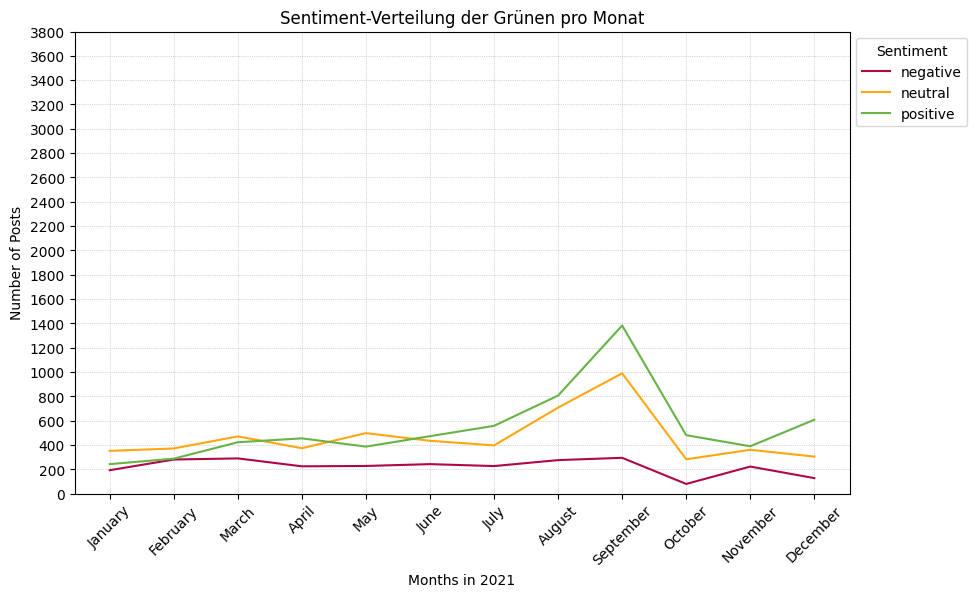

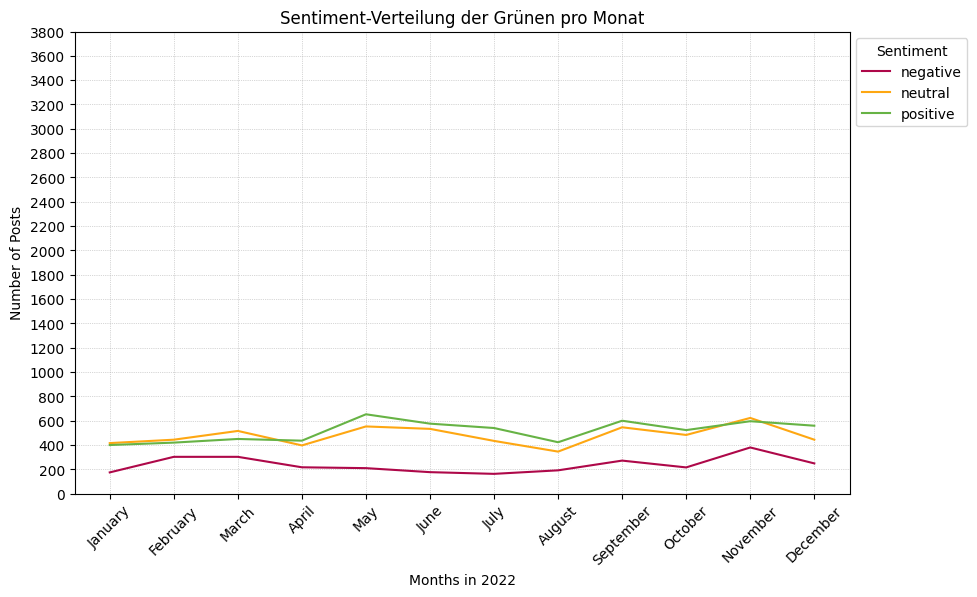

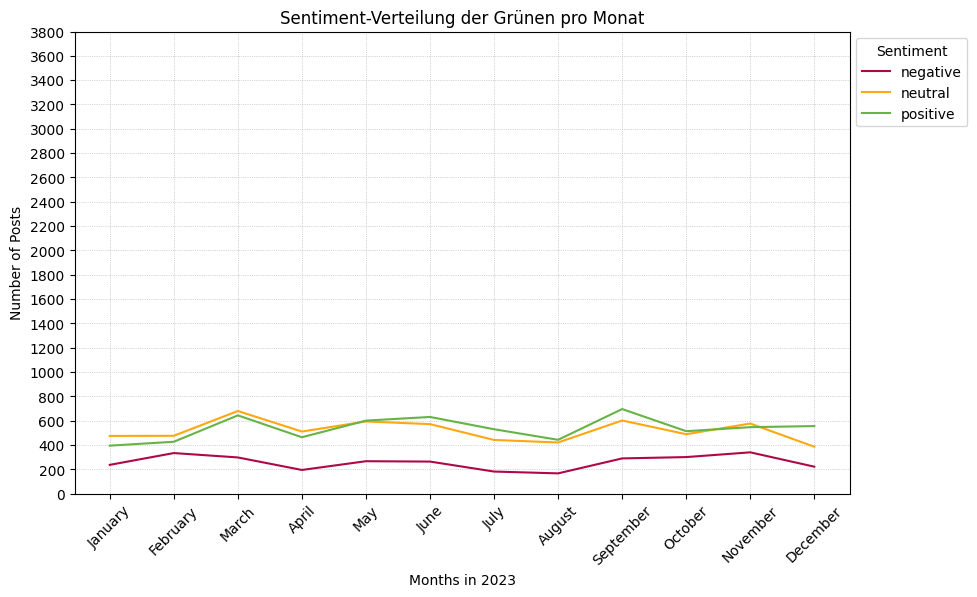

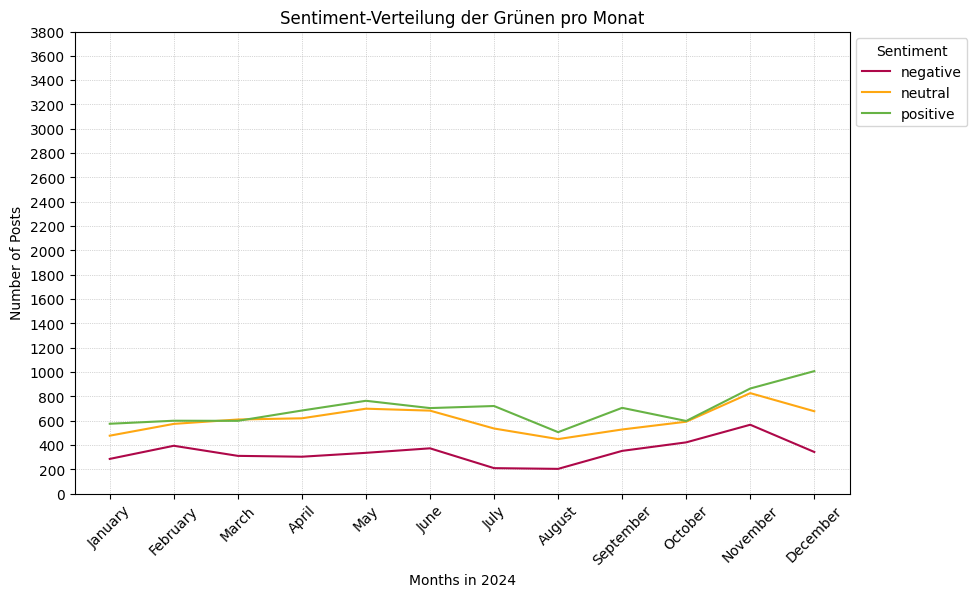

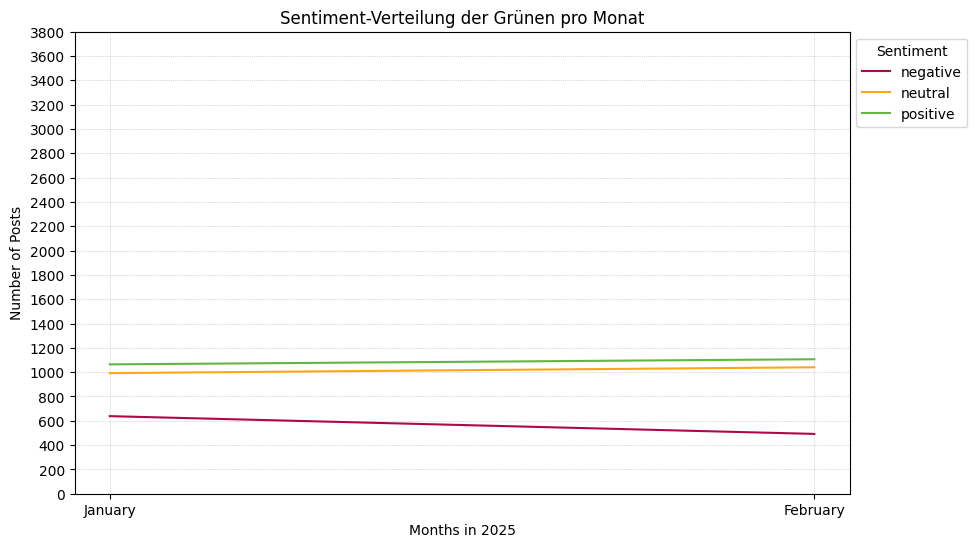

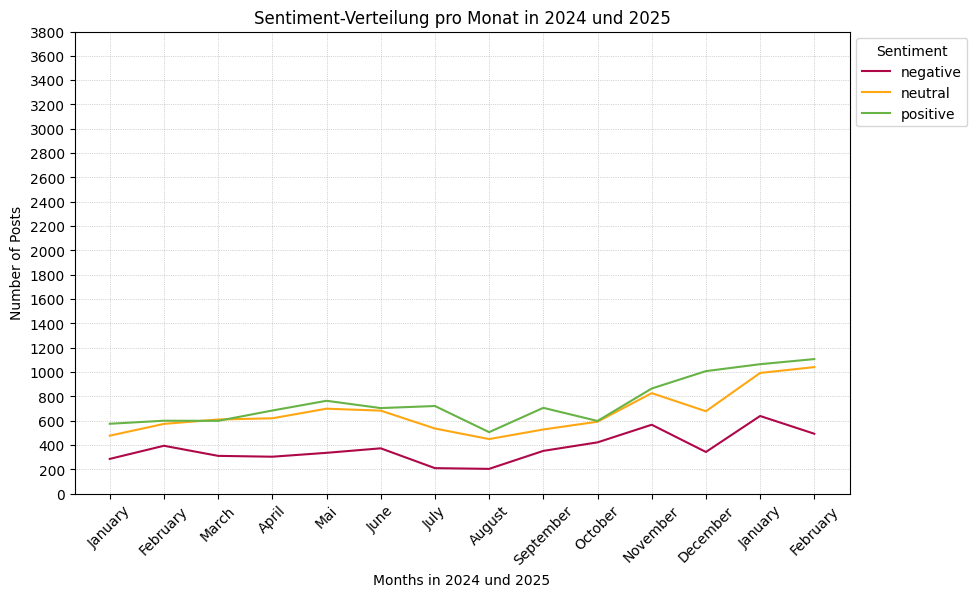

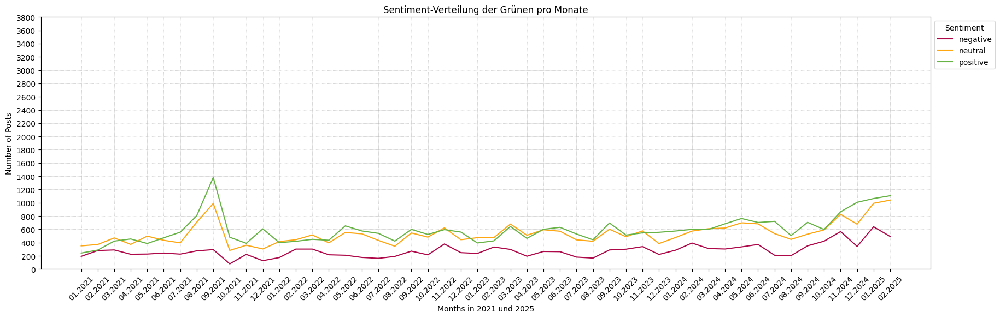

In [14]:
graph_jahr(g_Jahr_2021, "Sentiment-Verteilung der Grünen pro Monat", 2021)
graph_jahr(g_Jahr_2022, "Sentiment-Verteilung der Grünen pro Monat", 2022)
graph_jahr(g_Jahr_2023, "Sentiment-Verteilung der Grünen pro Monat", 2023)
graph_jahr(g_Jahr_2024, "Sentiment-Verteilung der Grünen pro Monat", 2024)

graph_2025(g_Jahr_2025, "Sentiment-Verteilung der Grünen pro Monat")
graph_2024_25(g_Jahr_2024, g_Jahr_2025, "Sentiment-Verteilung pro Monat in 2024 und 2025")
long_graph(g_vertical_concat, "Sentiment-Verteilung der Grünen pro Monate")

## CDU

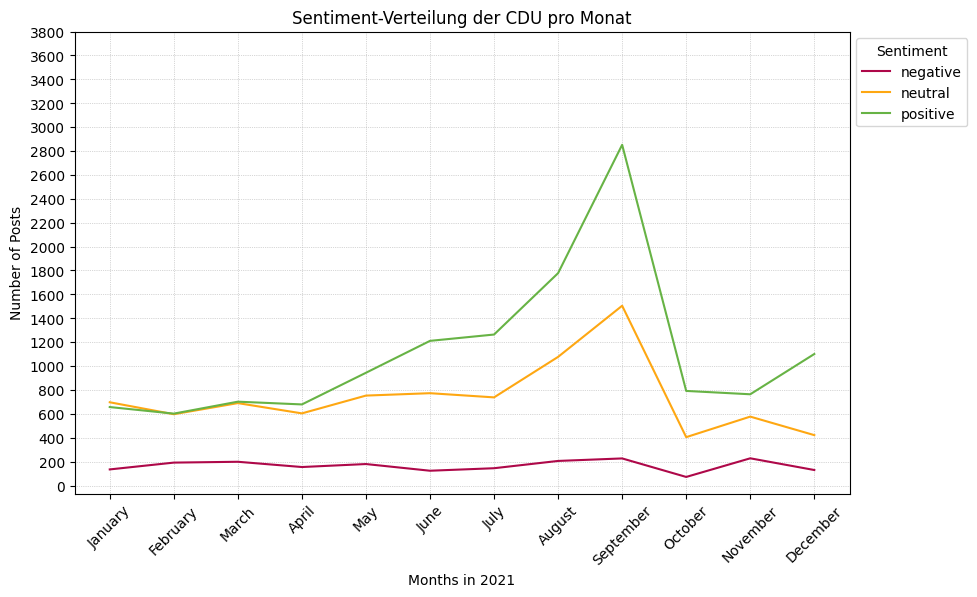

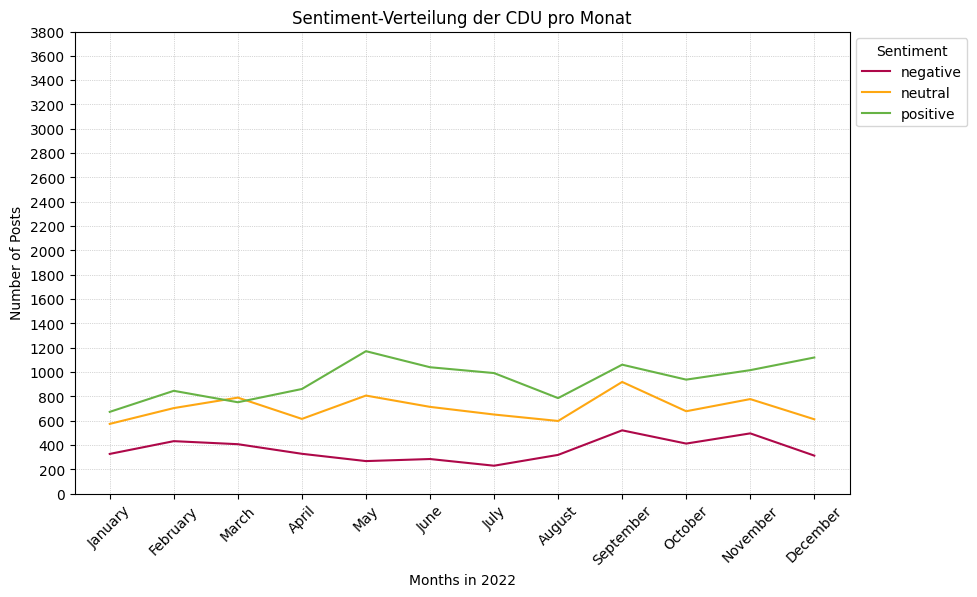

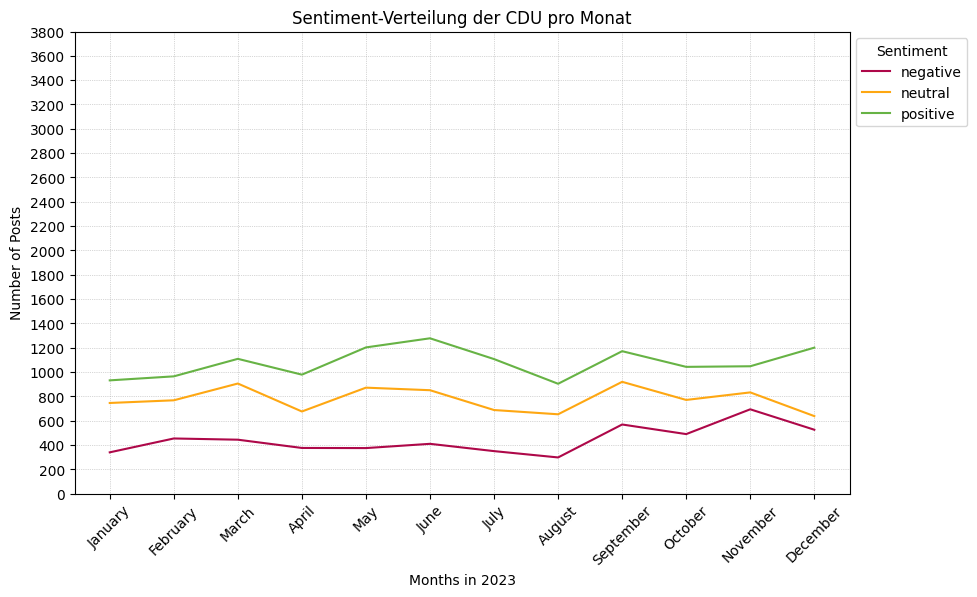

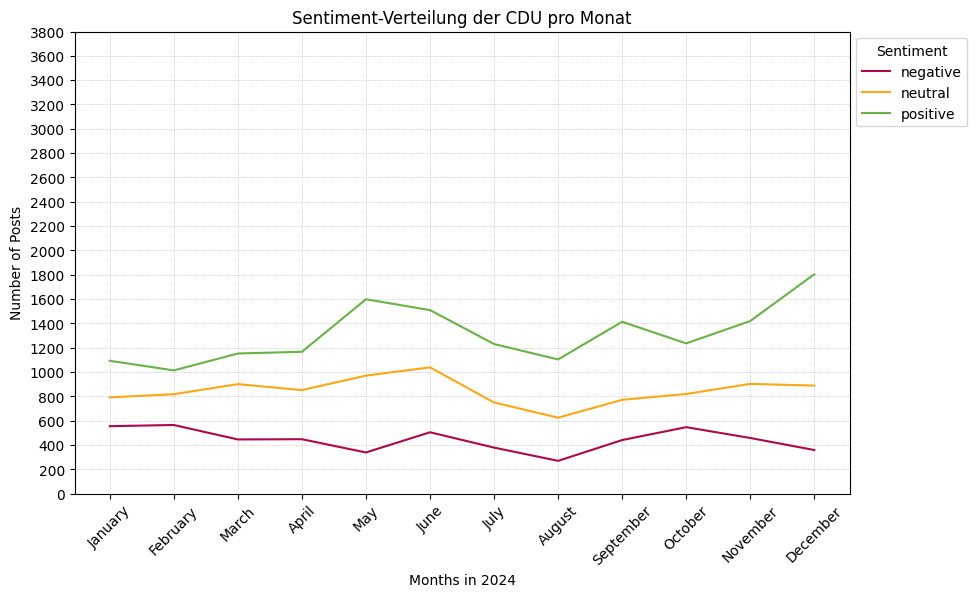

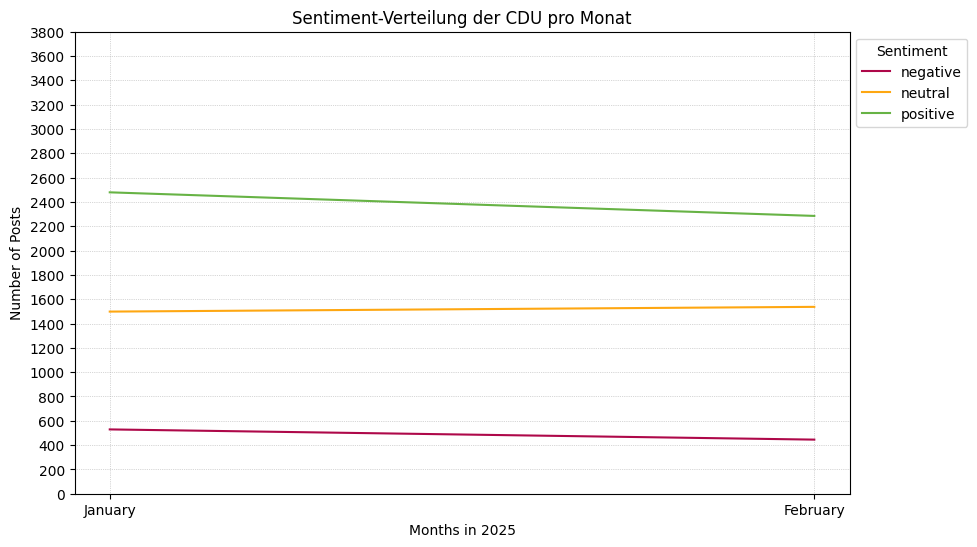

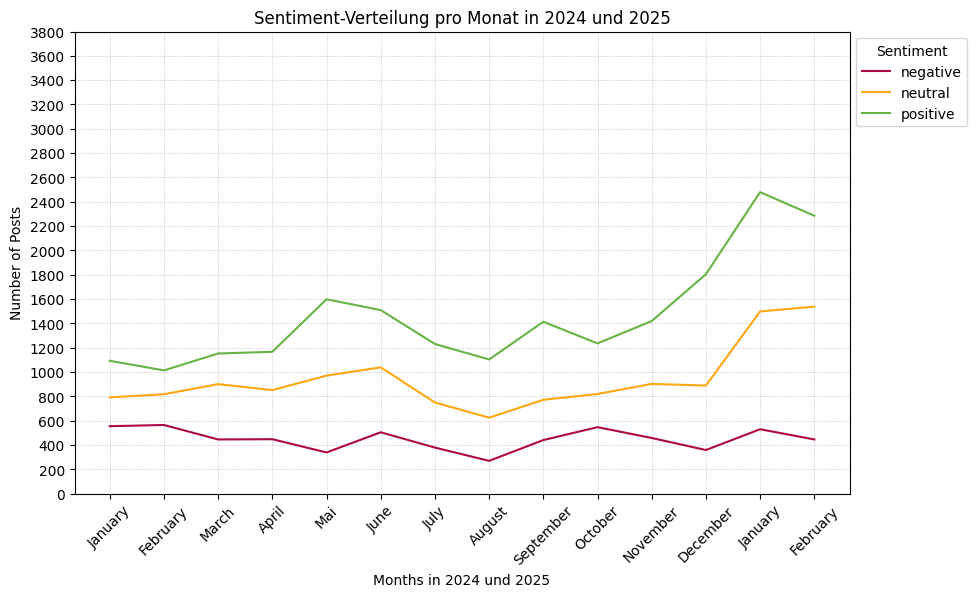

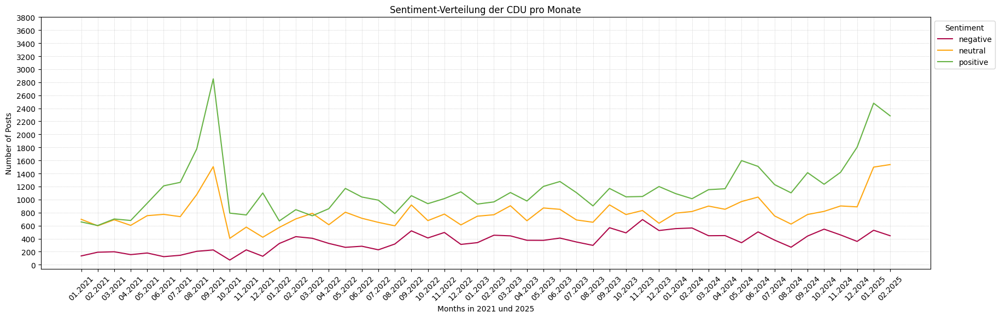

In [16]:
graph_jahr(cdu_Jahr_2021, "Sentiment-Verteilung der CDU pro Monat", 2021)
graph_jahr(cdu_Jahr_2022, "Sentiment-Verteilung der CDU pro Monat", 2022)
graph_jahr(cdu_Jahr_2023, "Sentiment-Verteilung der CDU pro Monat", 2023)
graph_jahr(cdu_Jahr_2024, "Sentiment-Verteilung der CDU pro Monat", 2024)

graph_2025(cdu_Jahr_2025, "Sentiment-Verteilung der CDU pro Monat")
graph_2024_25(cdu_Jahr_2024, cdu_Jahr_2025, "Sentiment-Verteilung pro Monat in 2024 und 2025")
long_graph(cdu_vertical_concat, "Sentiment-Verteilung der CDU pro Monate")

## CDU/CSU

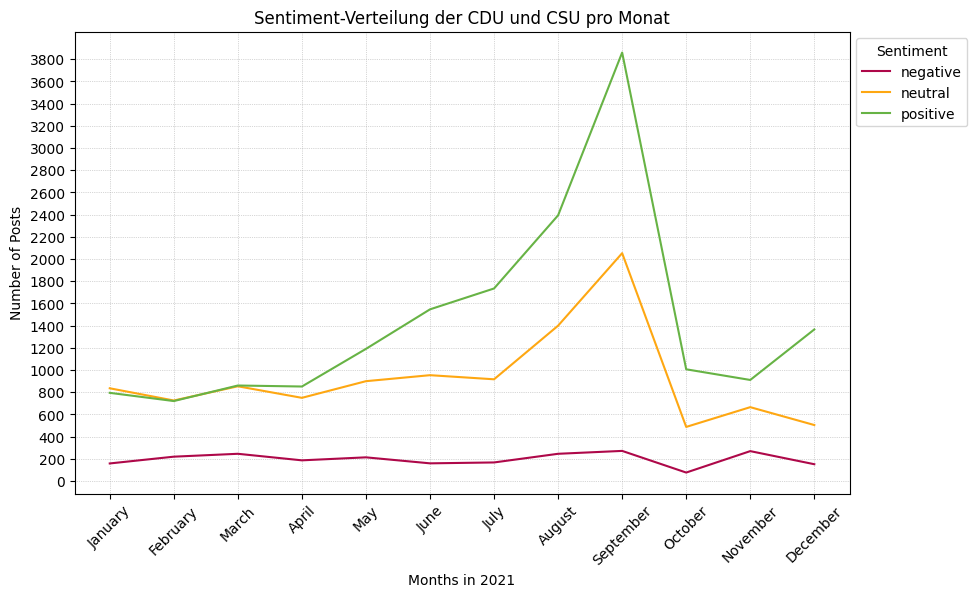

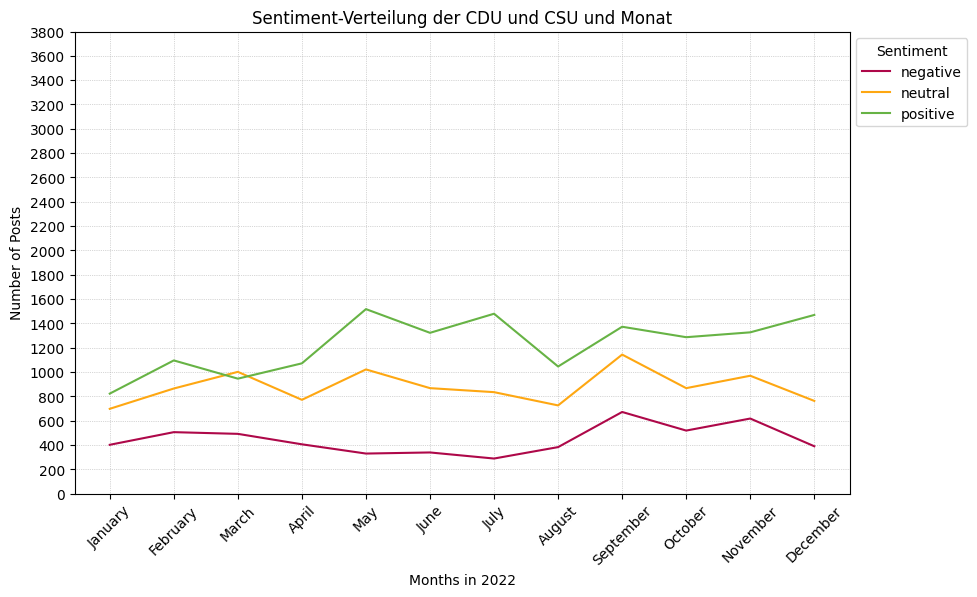

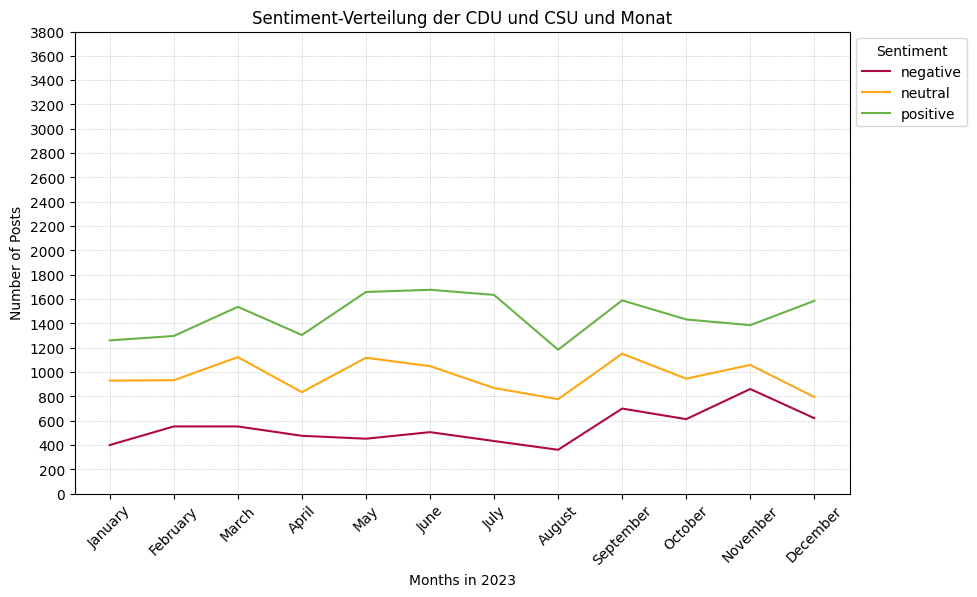

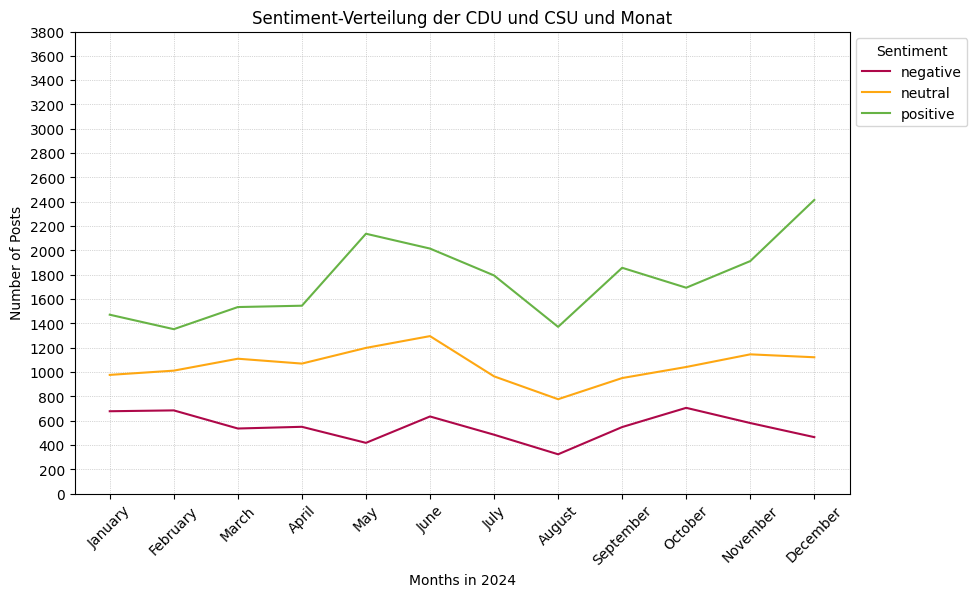

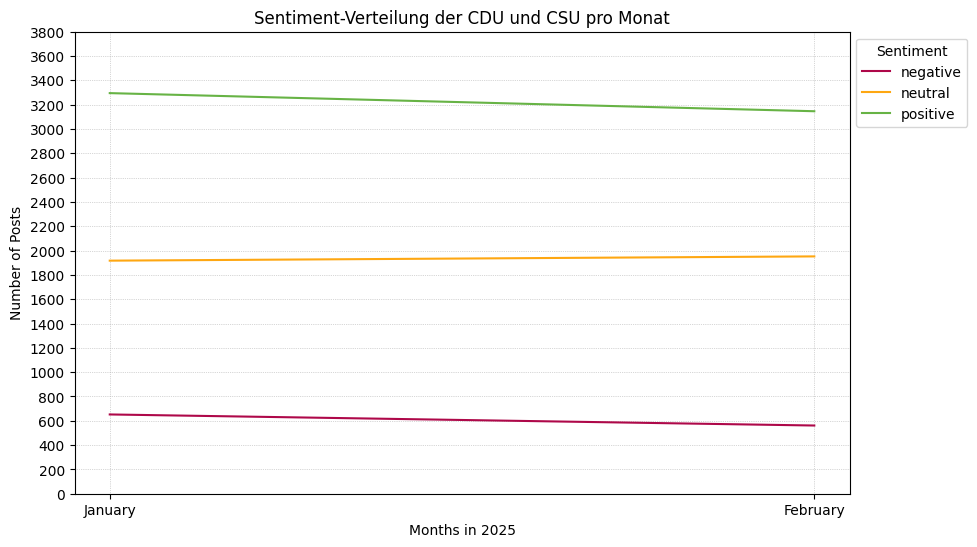

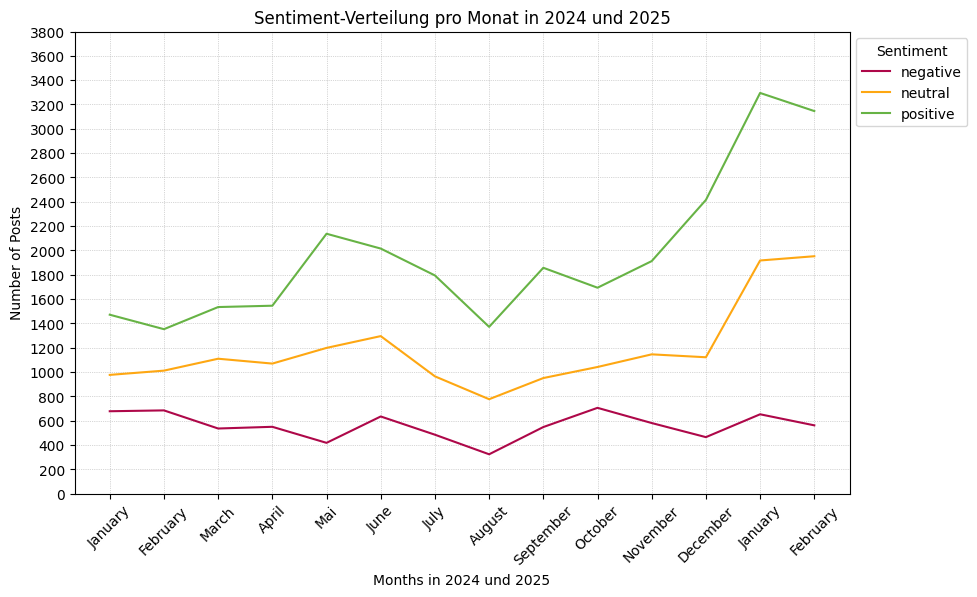

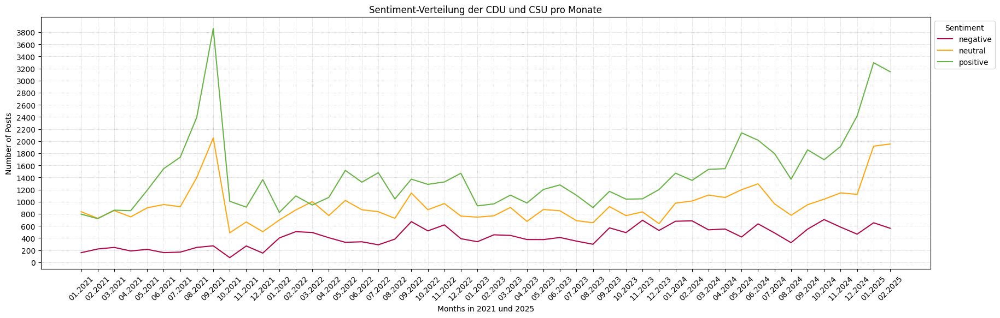

In [18]:
graph_jahr(cdu_csu_Jahr_2021, "Sentiment-Verteilung der CDU und CSU pro Monat", 2021)
graph_jahr(cdu_csu_Jahr_2022, "Sentiment-Verteilung der CDU und CSU und Monat", 2022)
graph_jahr(cdu_csu_Jahr_2023, "Sentiment-Verteilung der CDU und CSU und Monat", 2023)
graph_jahr(cdu_csu_Jahr_2024, "Sentiment-Verteilung der CDU und CSU und Monat", 2024)

graph_2025(cdu_csu_Jahr_2025, "Sentiment-Verteilung der CDU und CSU pro Monat")
graph_2024_25(cdu_csu_Jahr_2024, cdu_csu_Jahr_2025, "Sentiment-Verteilung pro Monat in 2024 und 2025")

long_graph(cdu_csu_vertical_concat, "Sentiment-Verteilung der CDU und CSU pro Monate")

## SPD

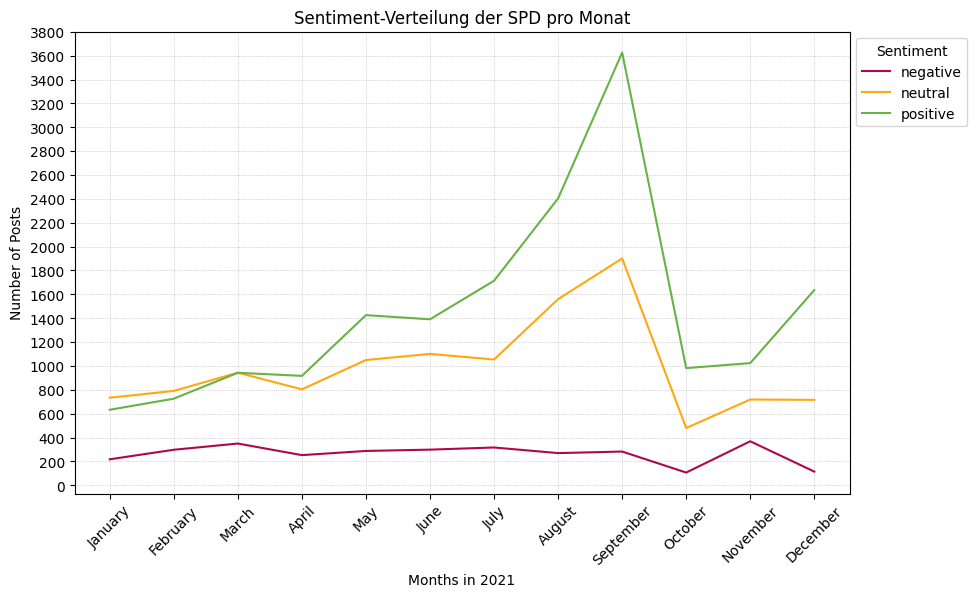

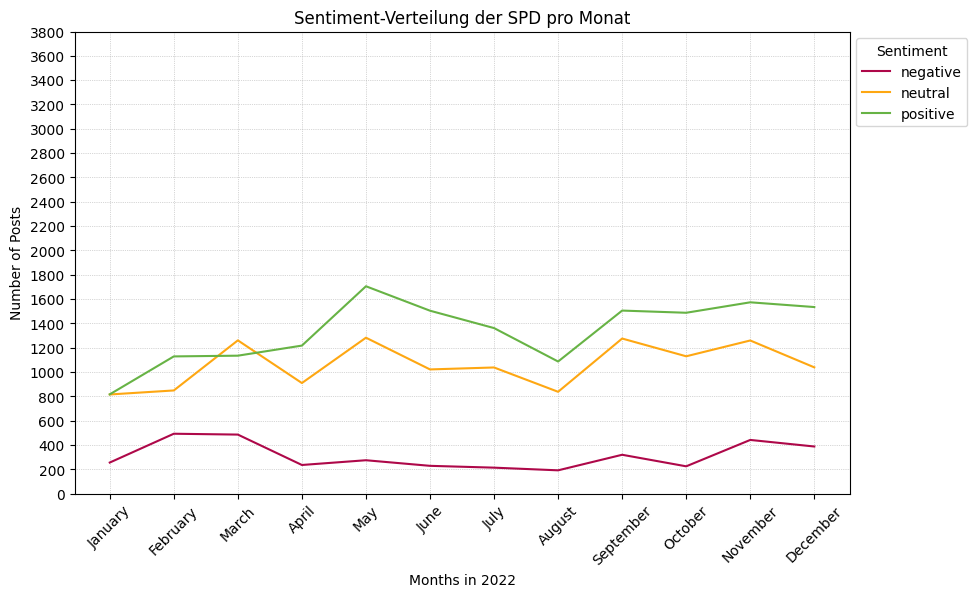

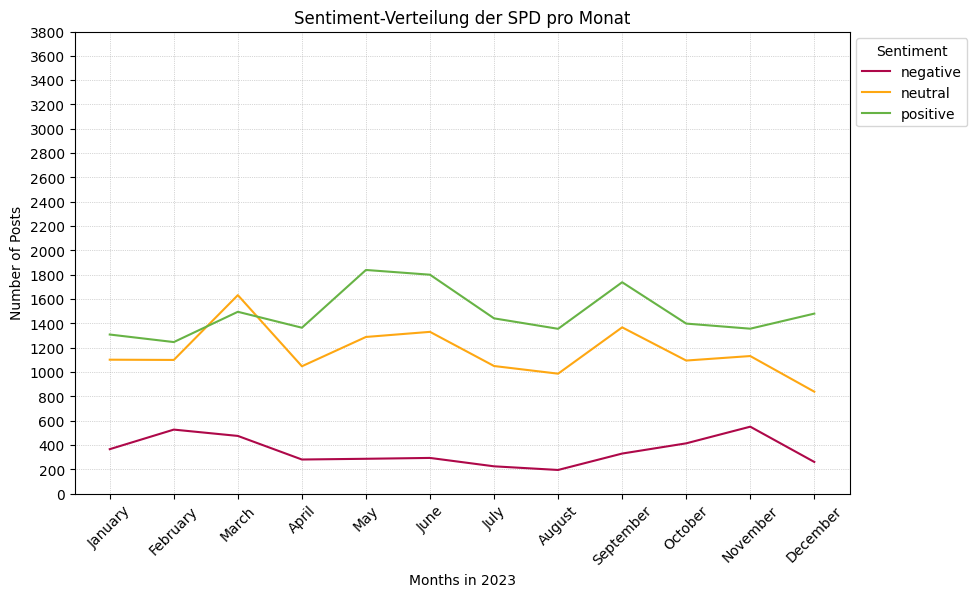

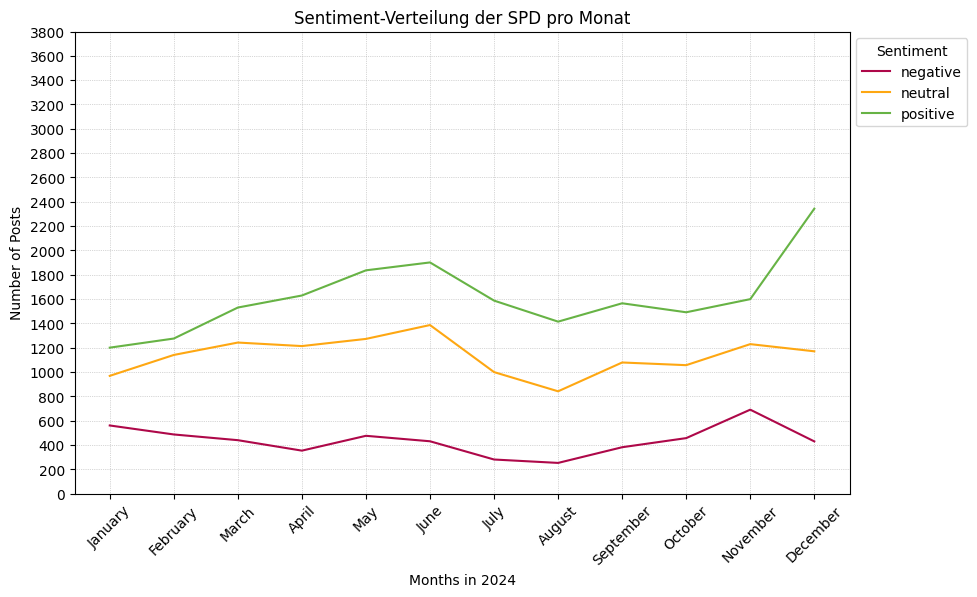

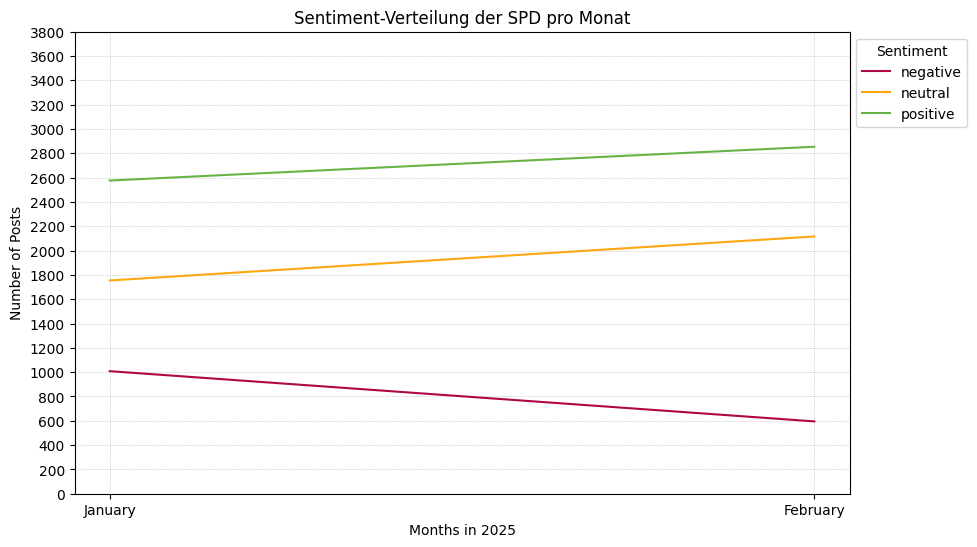

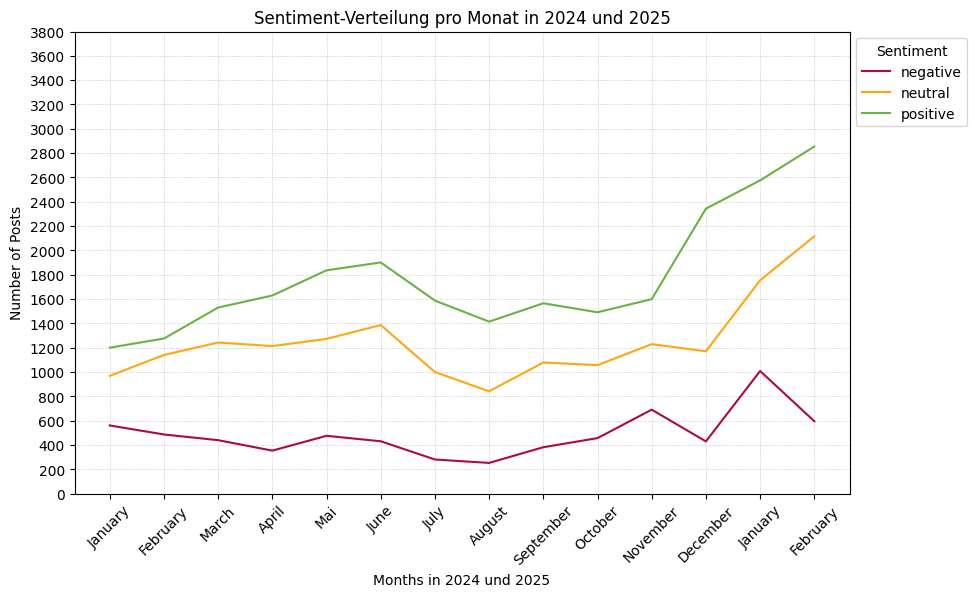

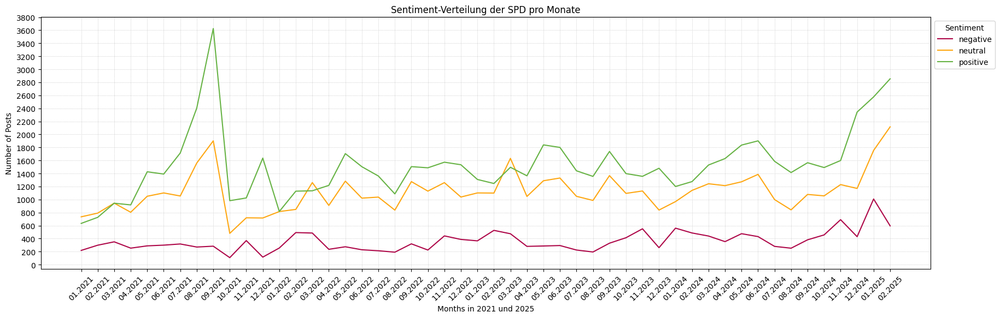

In [20]:
graph_jahr(spd_Jahr_2021, "Sentiment-Verteilung der SPD pro Monat", 2021)
graph_jahr(spd_Jahr_2022, "Sentiment-Verteilung der SPD pro Monat", 2022)
graph_jahr(spd_Jahr_2023, "Sentiment-Verteilung der SPD pro Monat", 2023)
graph_jahr(spd_Jahr_2024, "Sentiment-Verteilung der SPD pro Monat", 2024)

graph_2025(spd_Jahr_2025, "Sentiment-Verteilung der SPD pro Monat")

graph_2024_25(spd_Jahr_2024, spd_Jahr_2025, "Sentiment-Verteilung pro Monat in 2024 und 2025")
long_graph(spd_vertical_concat, "Sentiment-Verteilung der SPD pro Monate")


## CSU

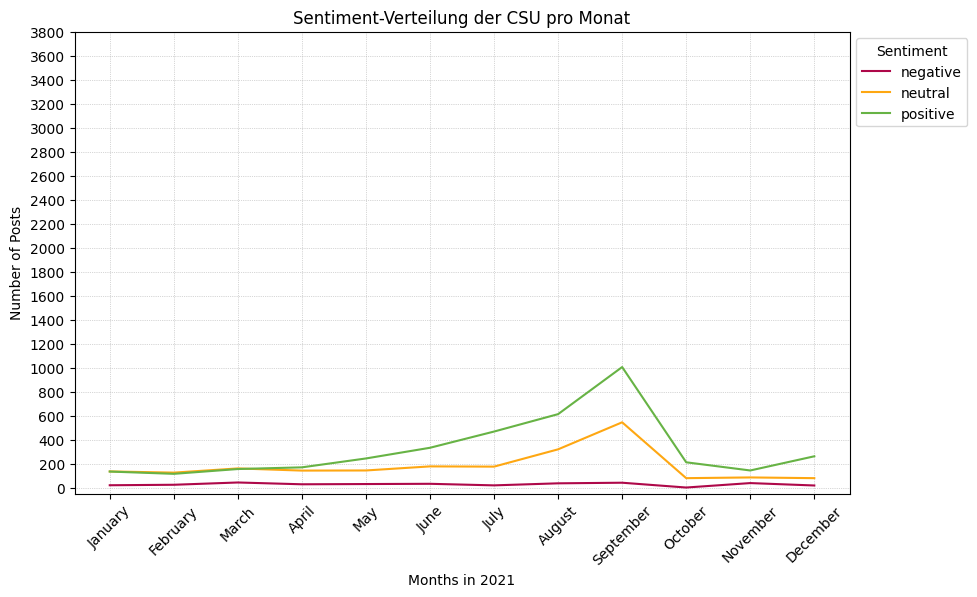

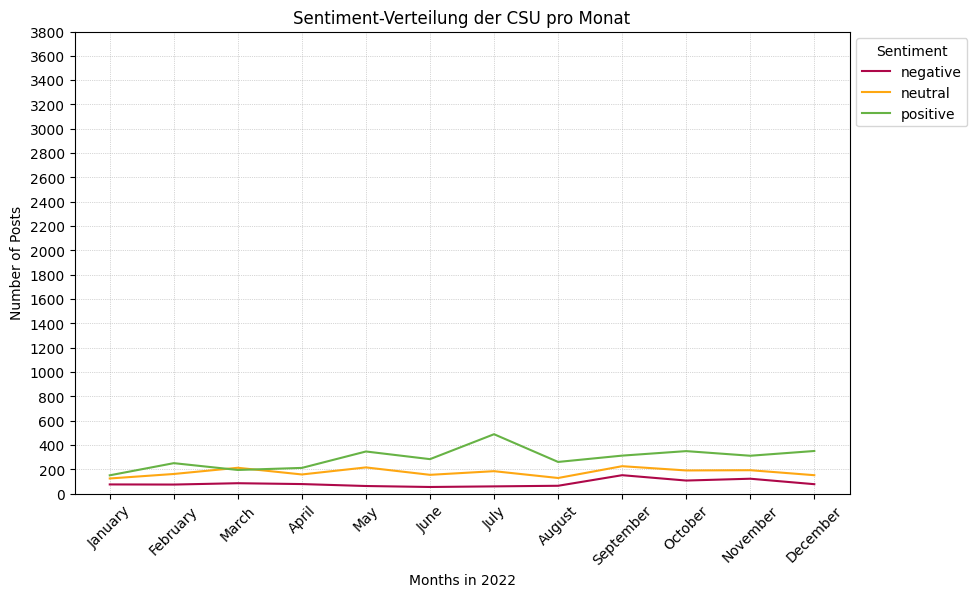

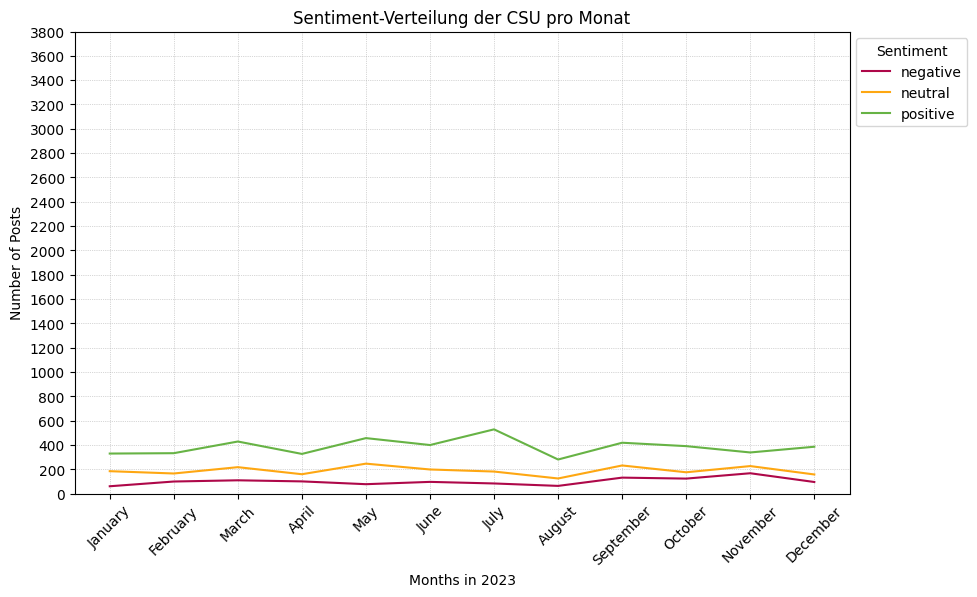

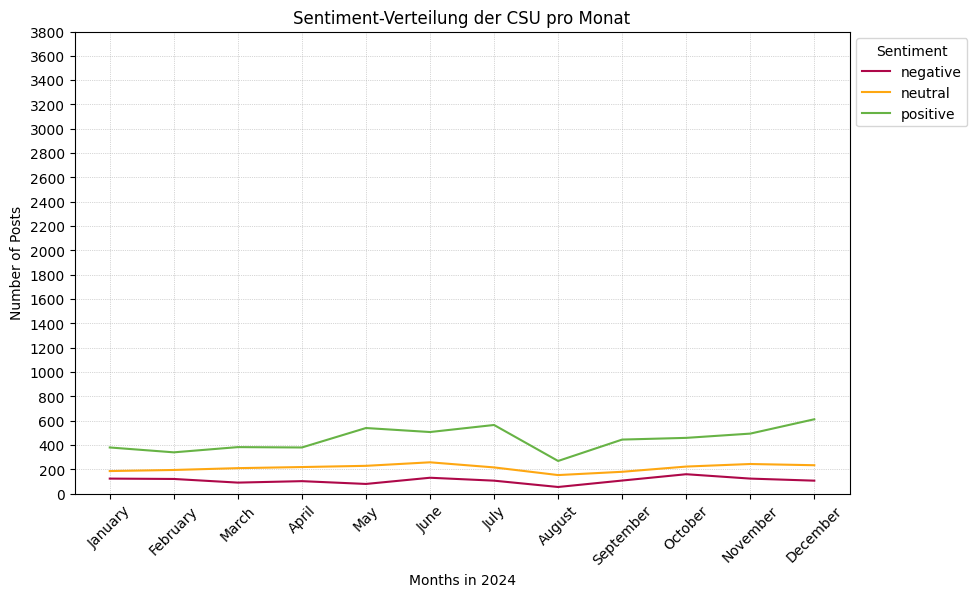

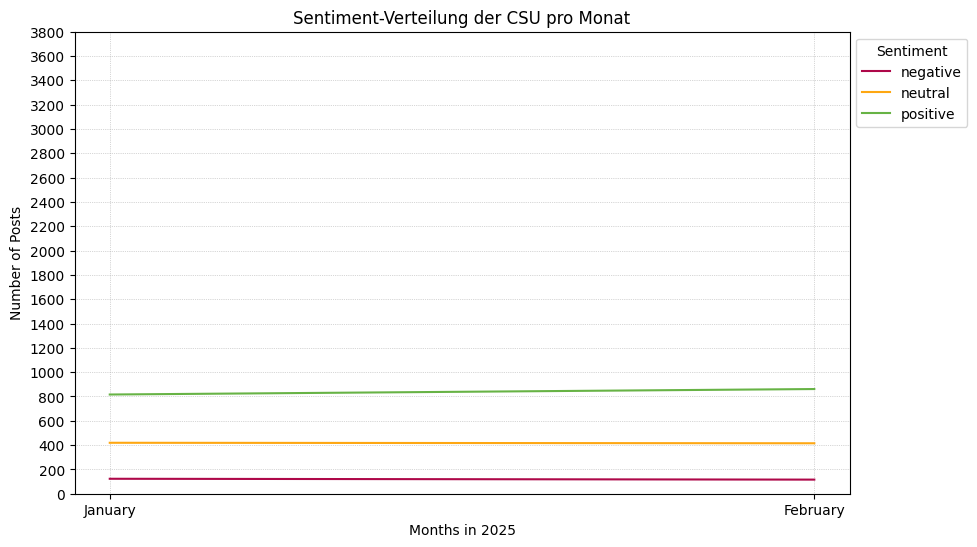

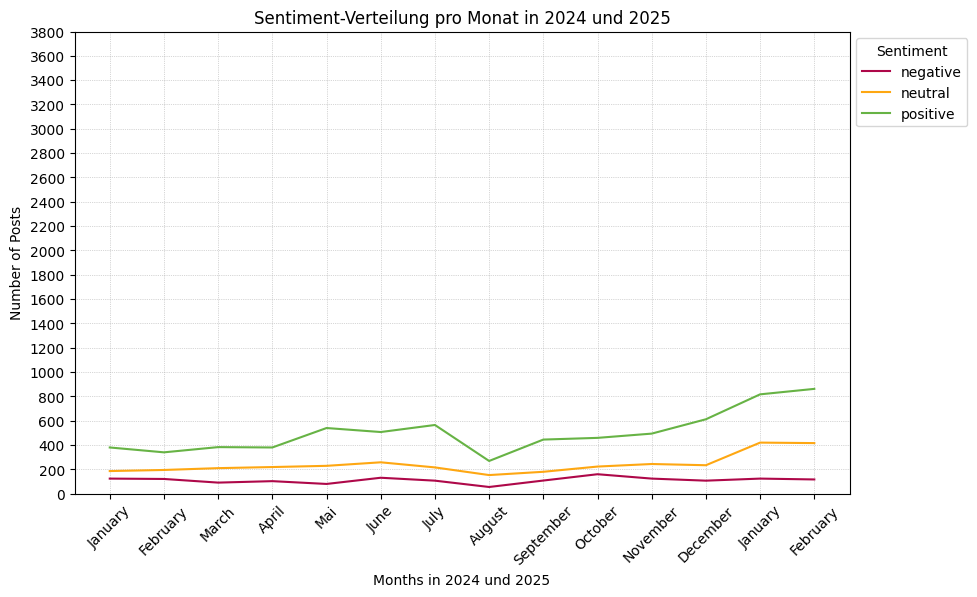

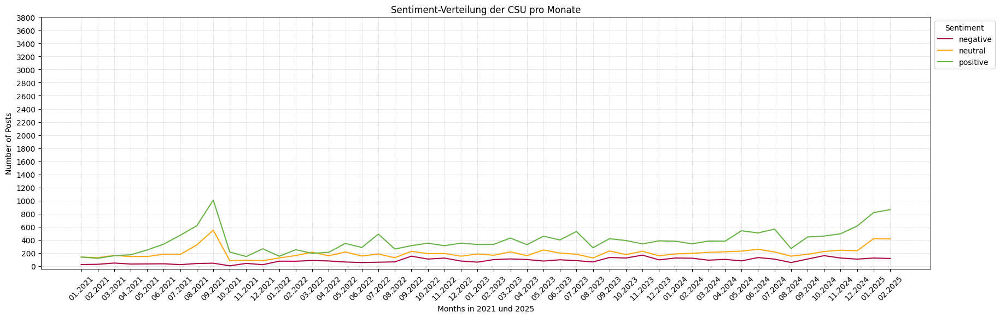

In [22]:
graph_jahr(csu_Jahr_2021, "Sentiment-Verteilung der CSU pro Monat", 2021)
graph_jahr(csu_Jahr_2022, "Sentiment-Verteilung der CSU pro Monat", 2022)
graph_jahr(csu_Jahr_2023, "Sentiment-Verteilung der CSU pro Monat", 2023)
graph_jahr(csu_Jahr_2024, "Sentiment-Verteilung der CSU pro Monat", 2024)

graph_2025(csu_Jahr_2025, "Sentiment-Verteilung der CSU pro Monat")
graph_2024_25(csu_Jahr_2024, csu_Jahr_2025, "Sentiment-Verteilung pro Monat in 2024 und 2025")
long_graph(csu_vertical_concat, "Sentiment-Verteilung der CSU pro Monate")

## Die Linke

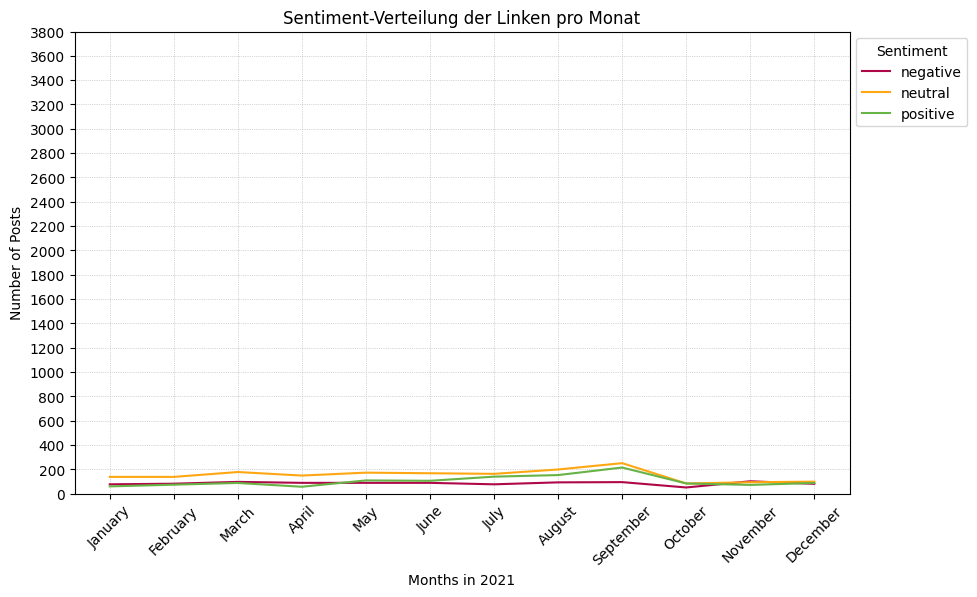

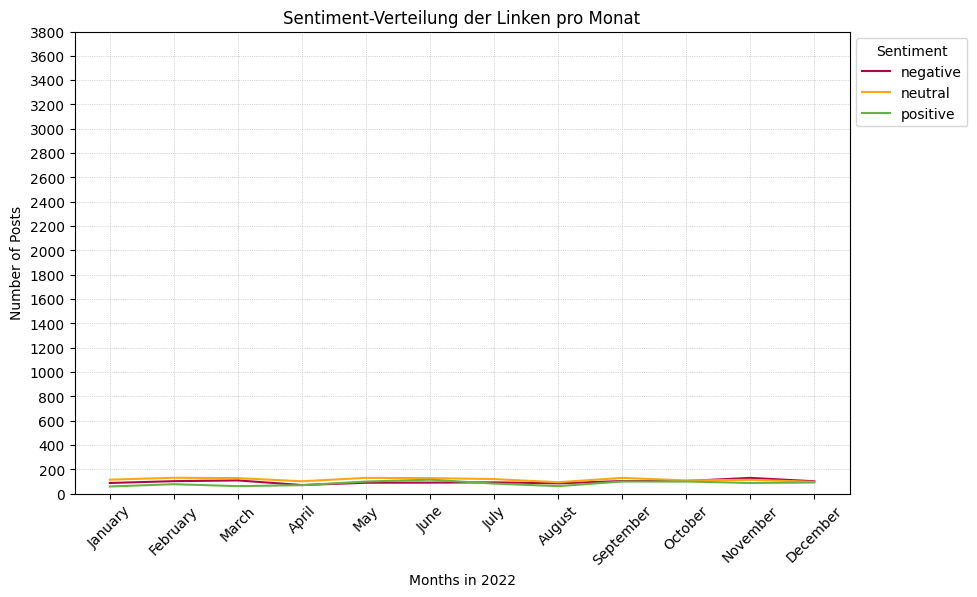

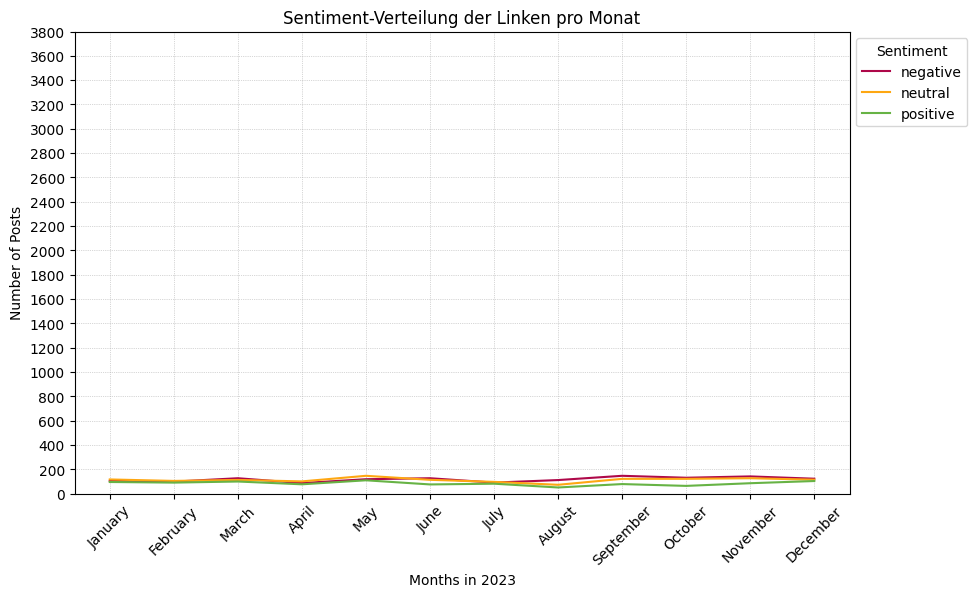

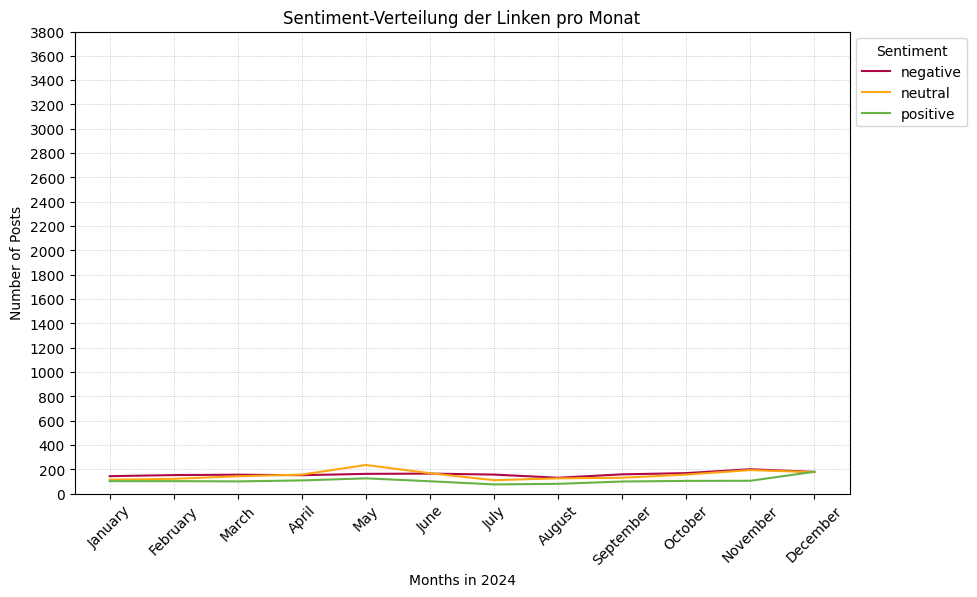

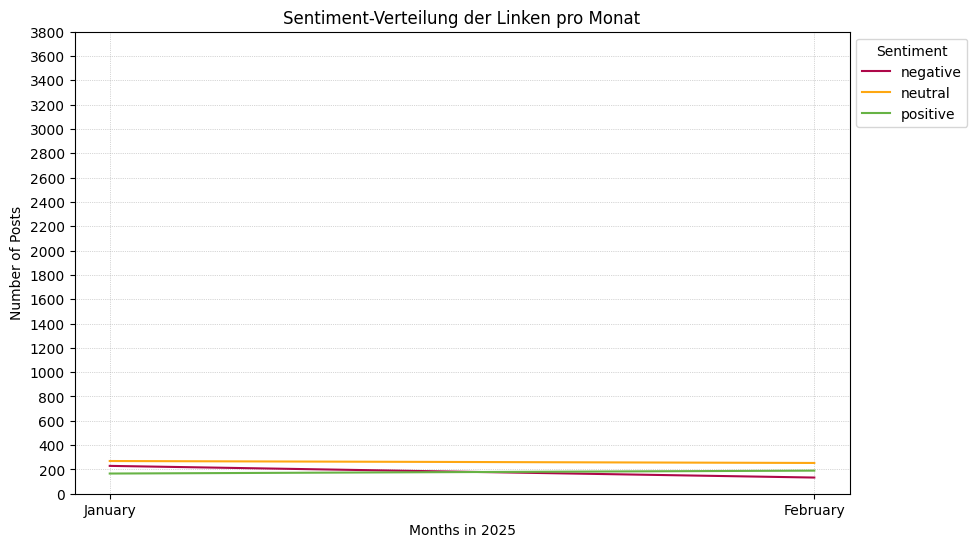

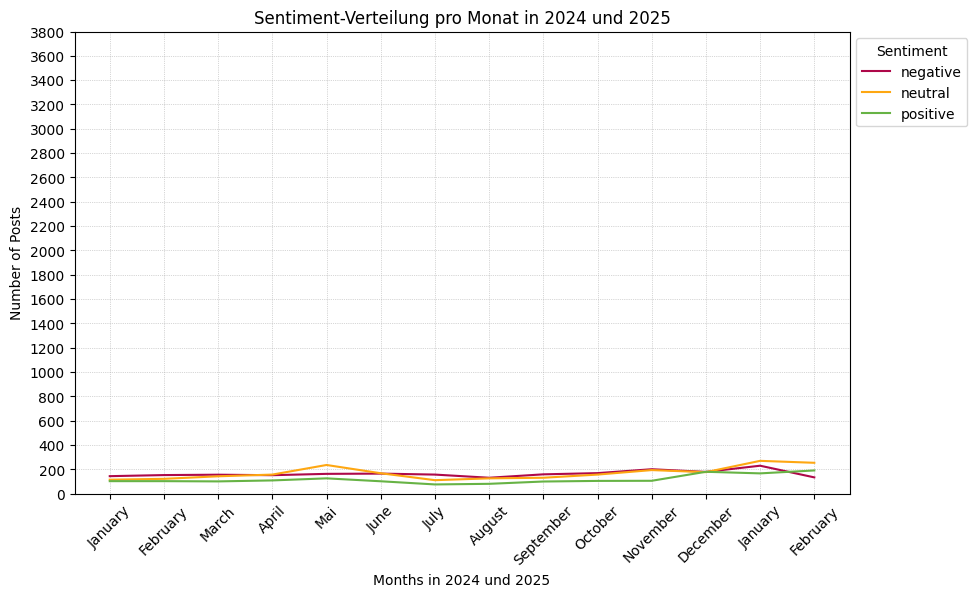

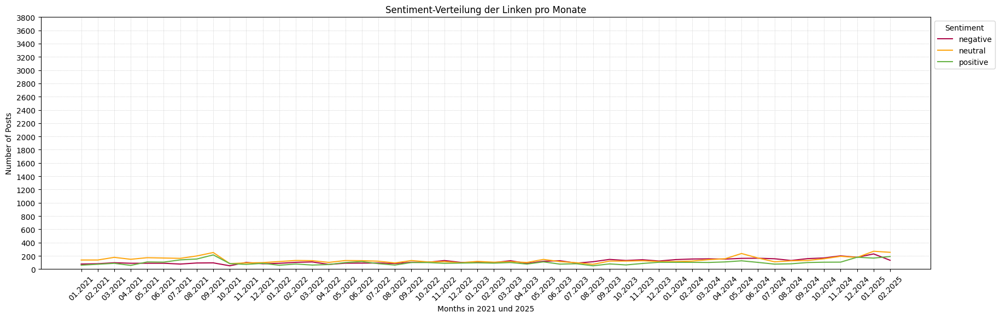

In [24]:
graph_jahr(l_Jahr_2021, "Sentiment-Verteilung der Linken pro Monat", 2021)
graph_jahr(l_Jahr_2022, "Sentiment-Verteilung der Linken pro Monat", 2022)
graph_jahr(l_Jahr_2023, "Sentiment-Verteilung der Linken pro Monat", 2023)
graph_jahr(l_Jahr_2024, "Sentiment-Verteilung der Linken pro Monat", 2024)

graph_2025(l_Jahr_2025, "Sentiment-Verteilung der Linken pro Monat")
graph_2024_25(l_Jahr_2024, l_Jahr_2025, "Sentiment-Verteilung pro Monat in 2024 und 2025")
long_graph(l_vertical_concat, "Sentiment-Verteilung der Linken pro Monate")

## AfD

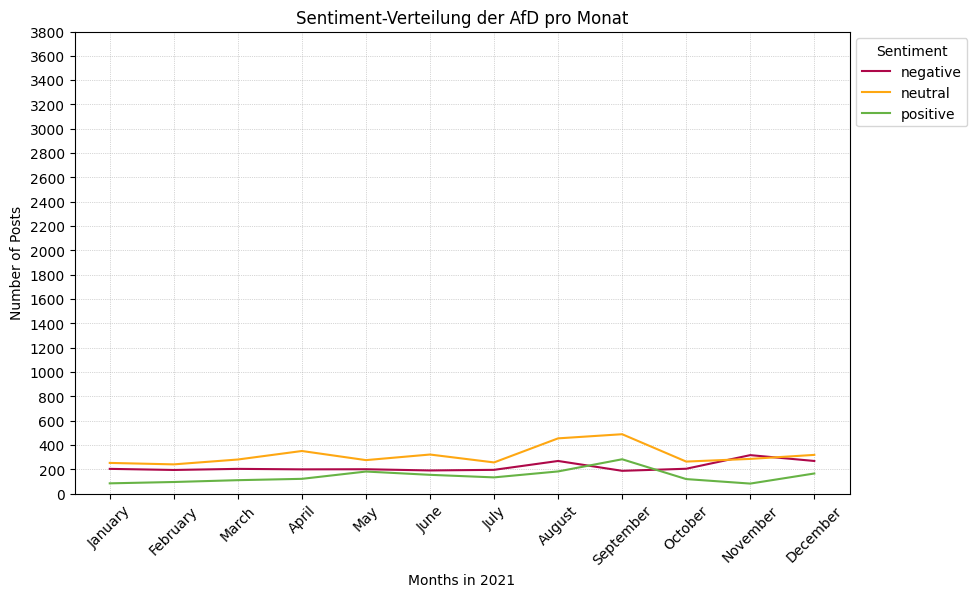

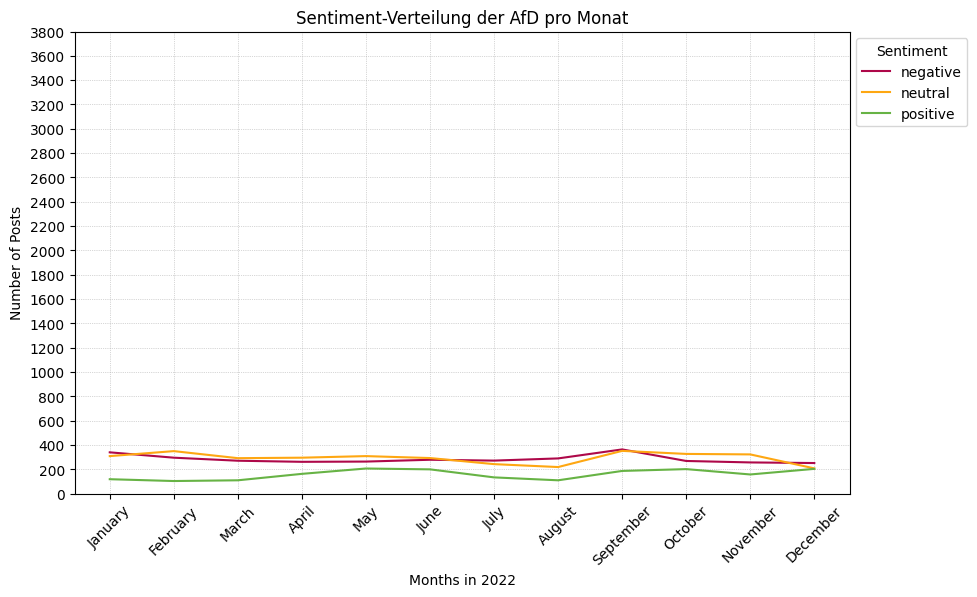

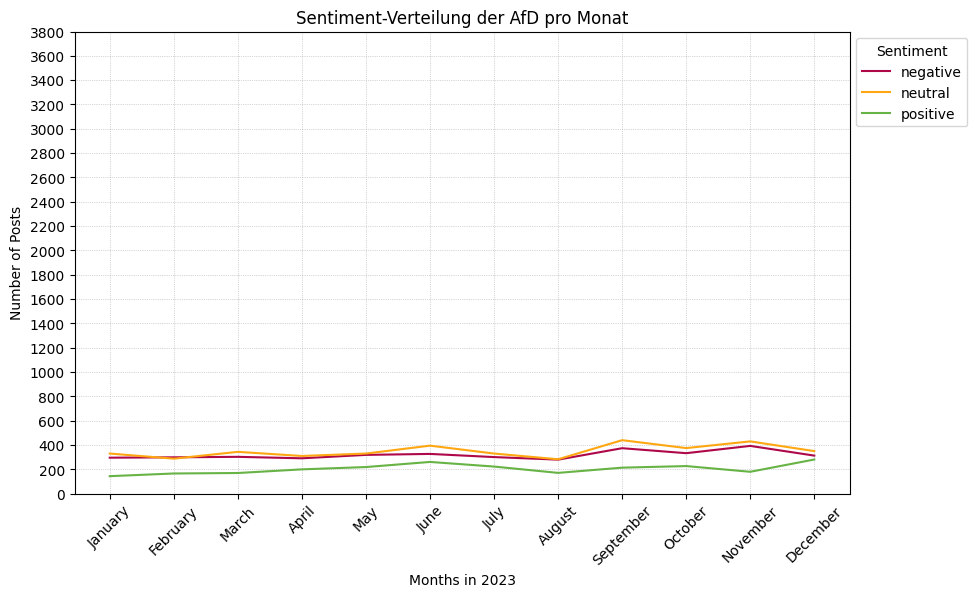

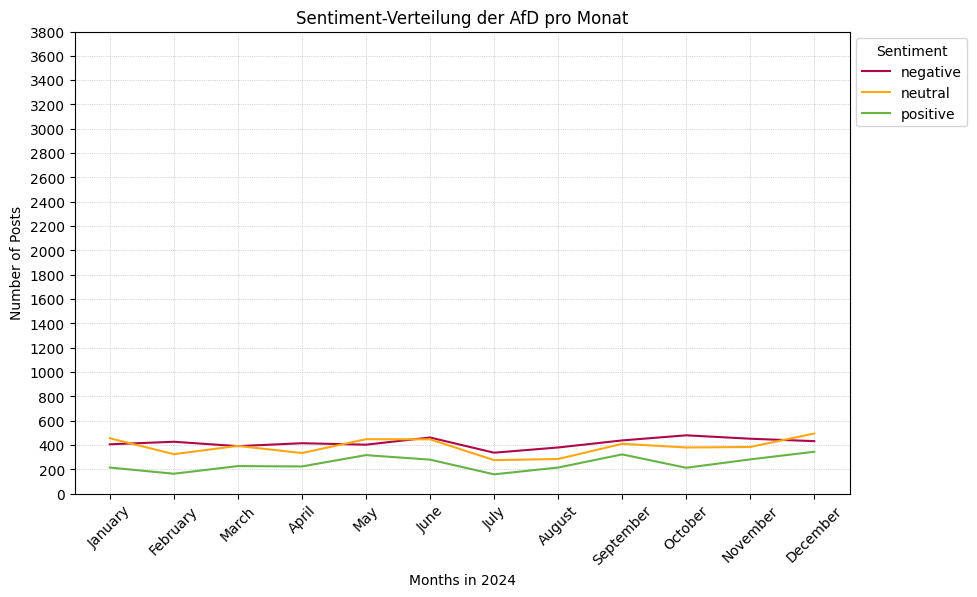

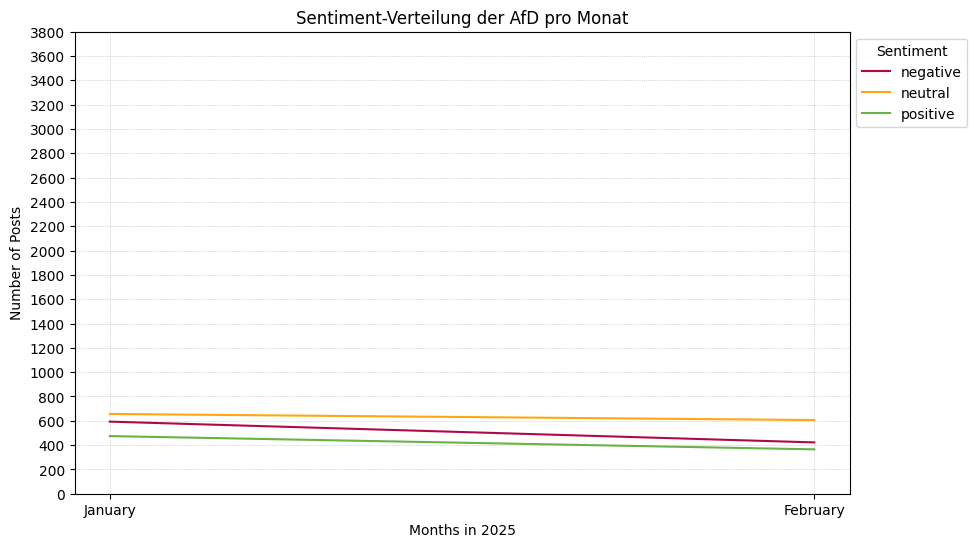

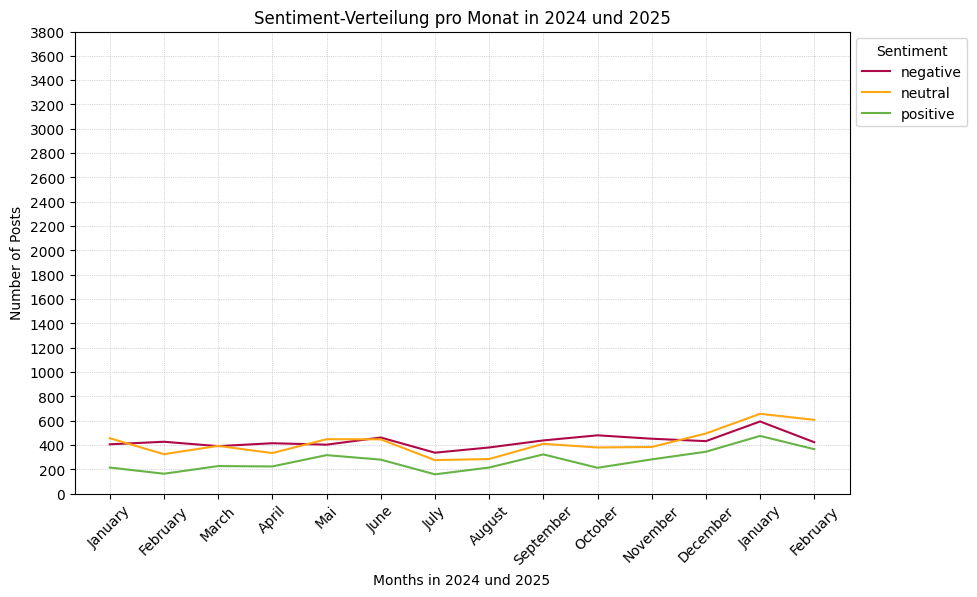

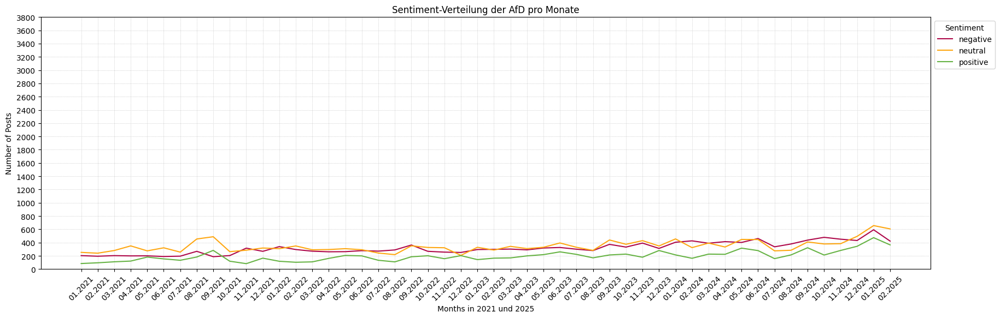

In [26]:
graph_jahr(afd_Jahr_2021, "Sentiment-Verteilung der AfD pro Monat", 2021)
graph_jahr(afd_Jahr_2022, "Sentiment-Verteilung der AfD pro Monat", 2022)
graph_jahr(afd_Jahr_2023, "Sentiment-Verteilung der AfD pro Monat", 2023)
graph_jahr(afd_Jahr_2024, "Sentiment-Verteilung der AfD pro Monat", 2024)

graph_2025(afd_Jahr_2025, "Sentiment-Verteilung der AfD pro Monat")
graph_2024_25(afd_Jahr_2024, afd_Jahr_2025, "Sentiment-Verteilung pro Monat in 2024 und 2025")
long_graph(afd_vertical_concat, "Sentiment-Verteilung der AfD pro Monate")

## BSW

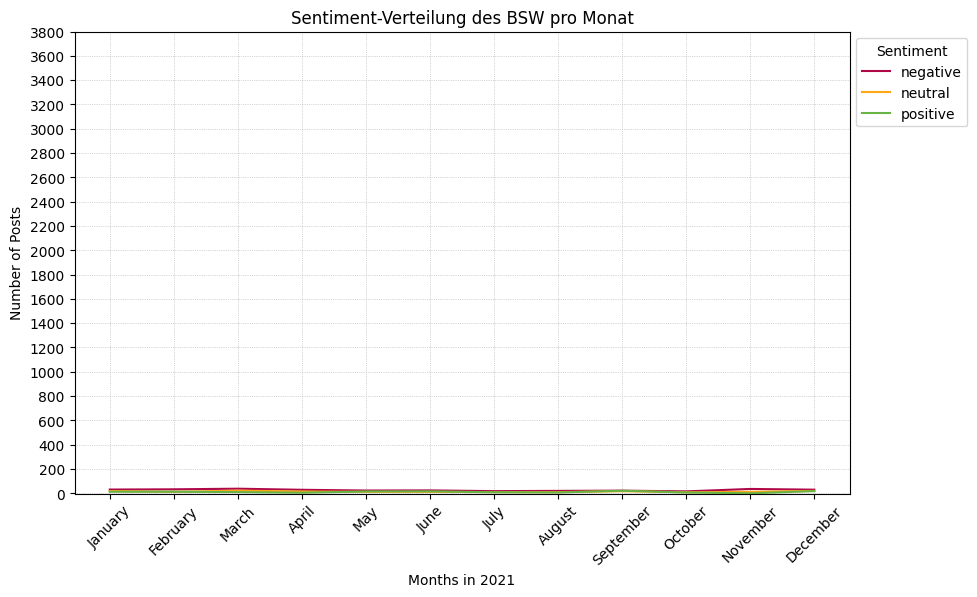

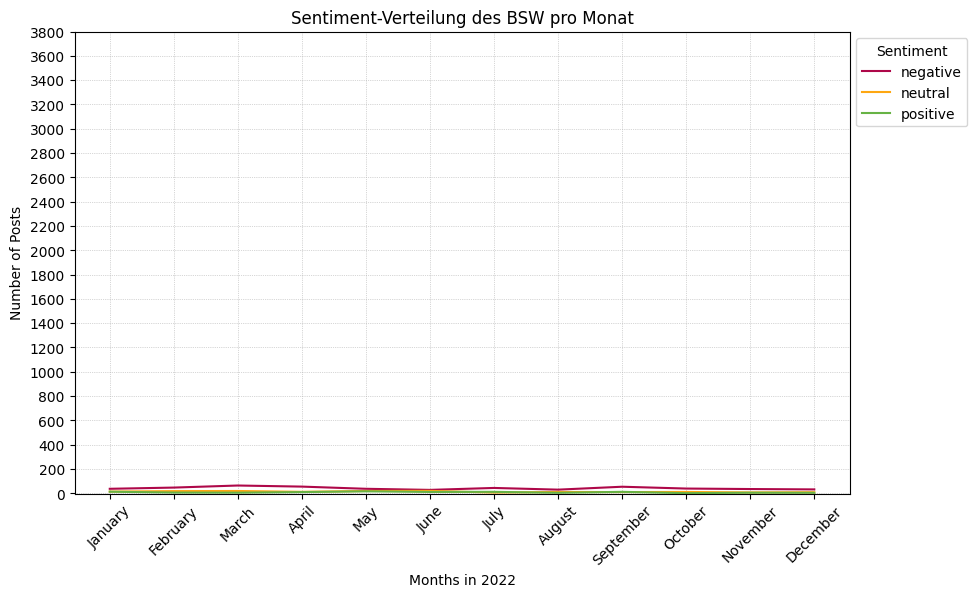

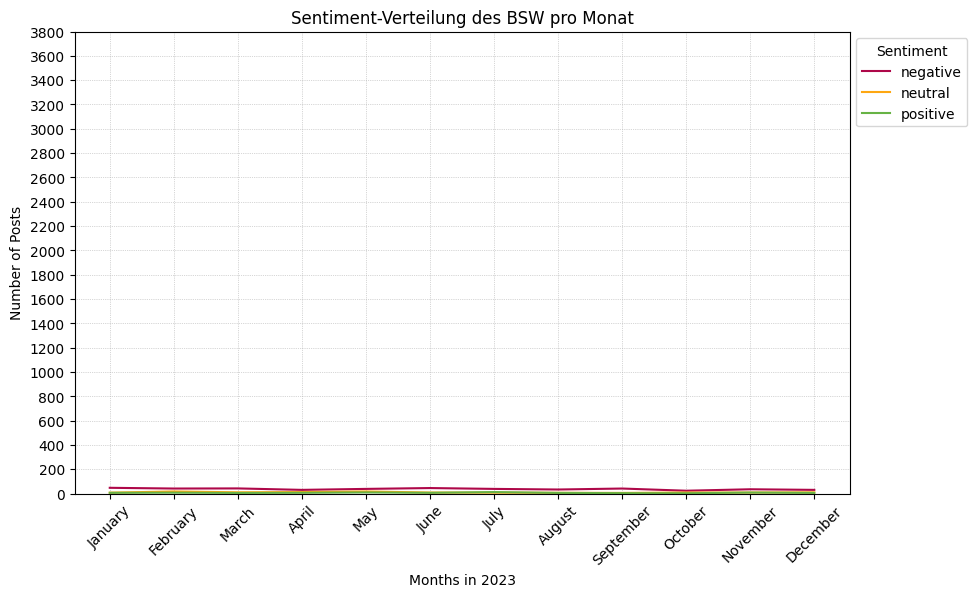

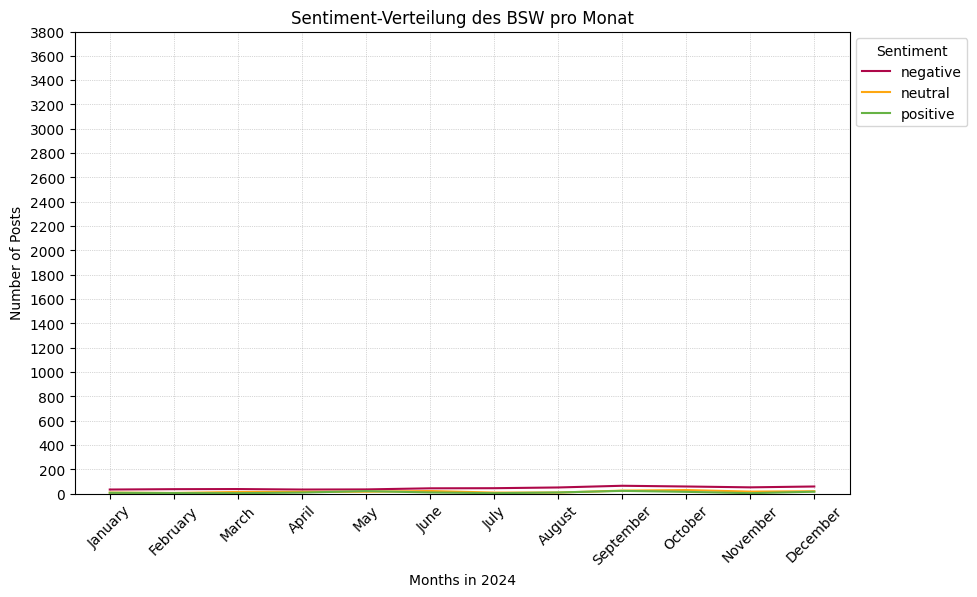

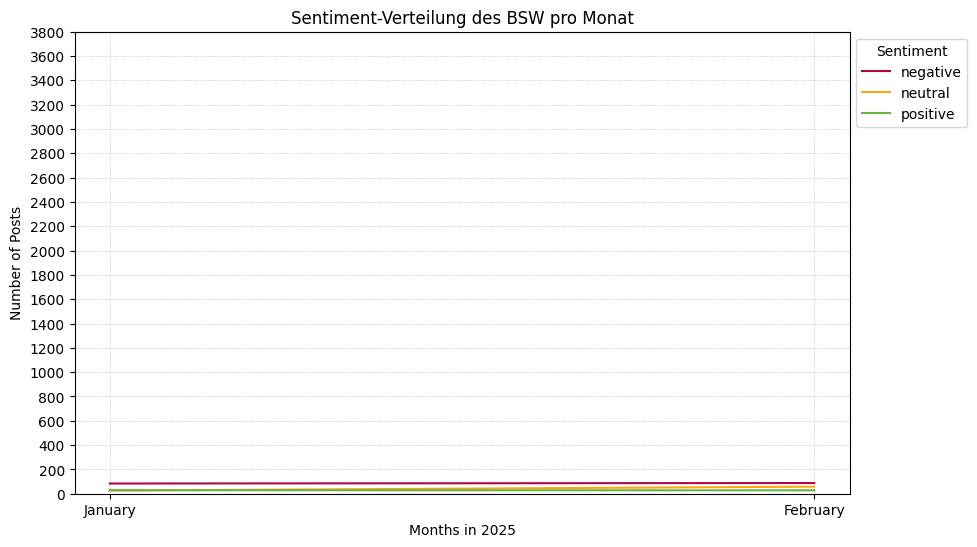

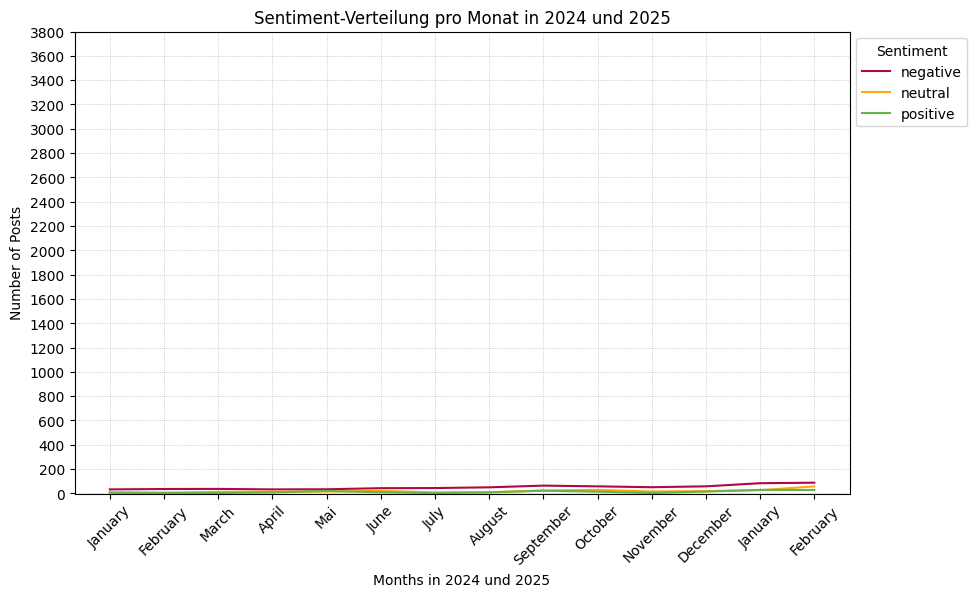

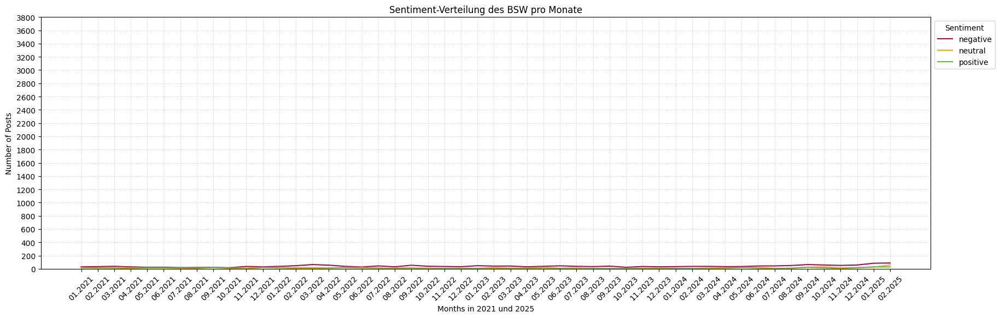

In [28]:
graph_jahr(bsw_Jahr_2021, "Sentiment-Verteilung des BSW pro Monat", 2021)
graph_jahr(bsw_Jahr_2022, "Sentiment-Verteilung des BSW pro Monat", 2022)
graph_jahr(bsw_Jahr_2023, "Sentiment-Verteilung des BSW pro Monat", 2023)
graph_jahr(bsw_Jahr_2024, "Sentiment-Verteilung des BSW pro Monat", 2024)

graph_2025(bsw_Jahr_2025, "Sentiment-Verteilung des BSW pro Monat")
graph_2024_25(bsw_Jahr_2024, bsw_Jahr_2025, "Sentiment-Verteilung pro Monat in 2024 und 2025")
long_graph(bsw_vertical_concat, "Sentiment-Verteilung des BSW pro Monate")

## FDP

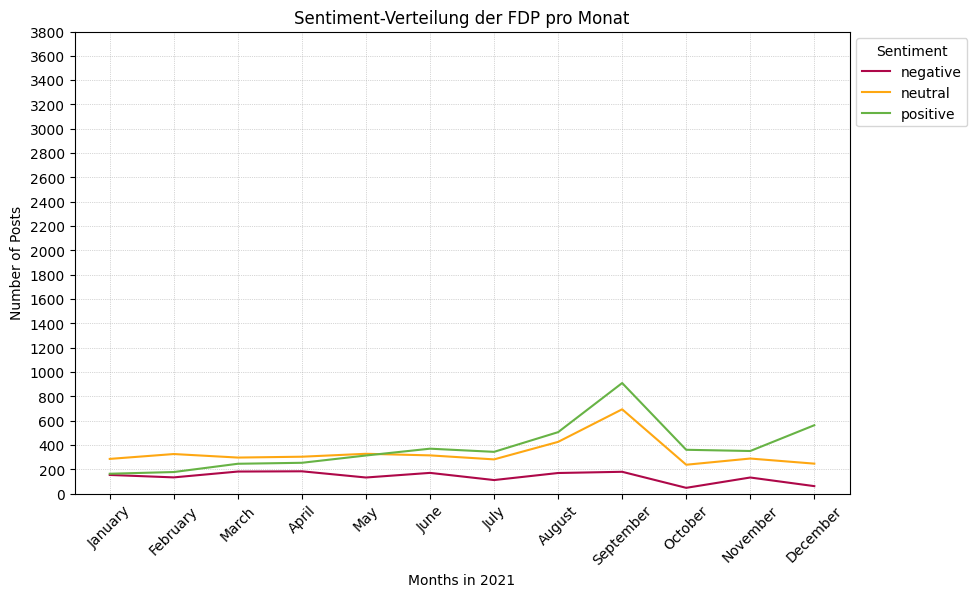

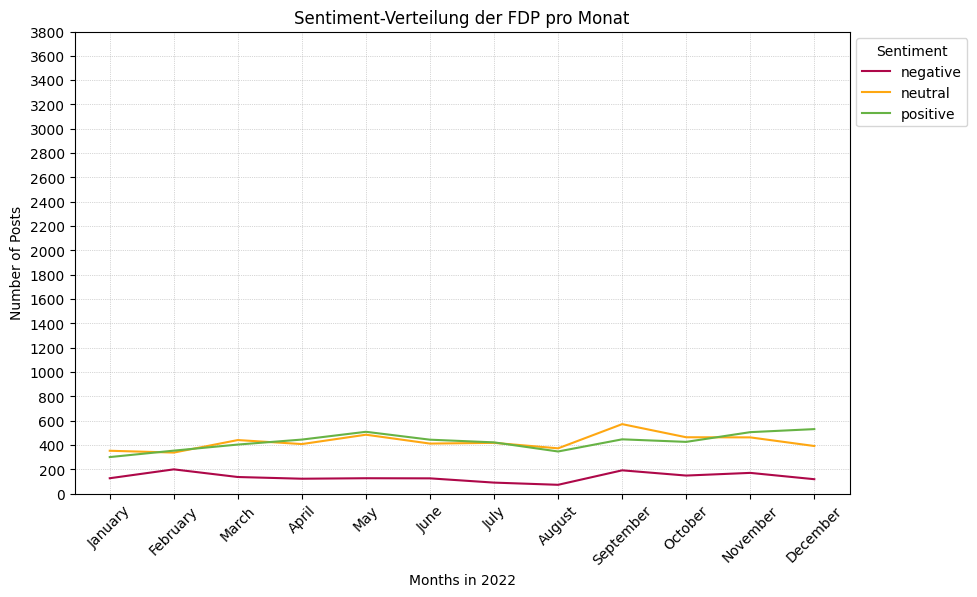

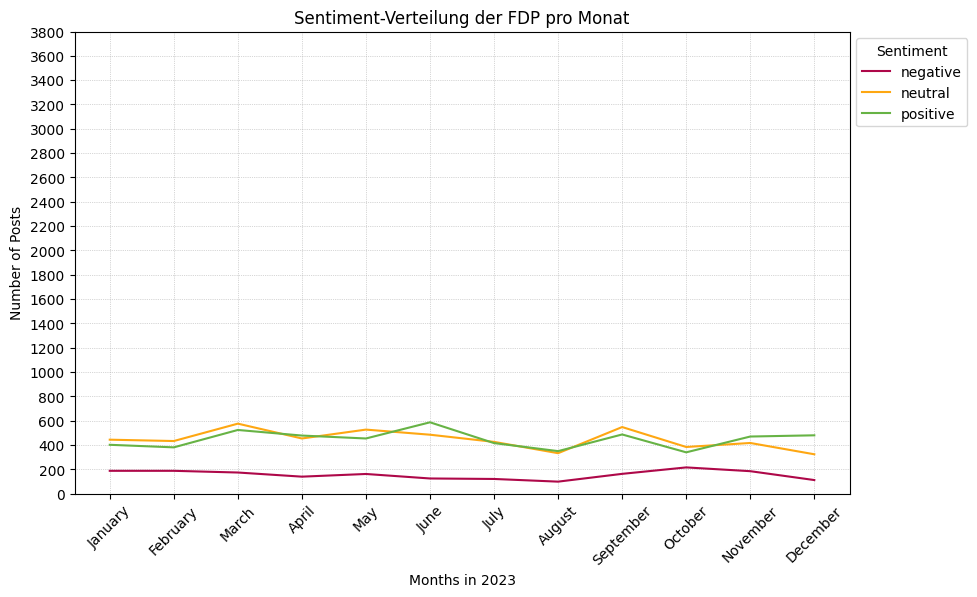

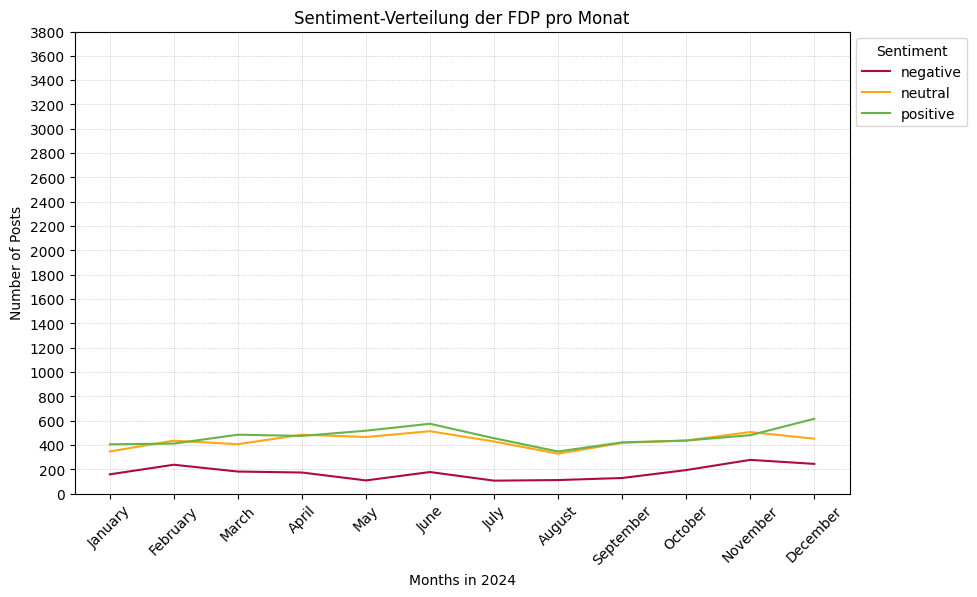

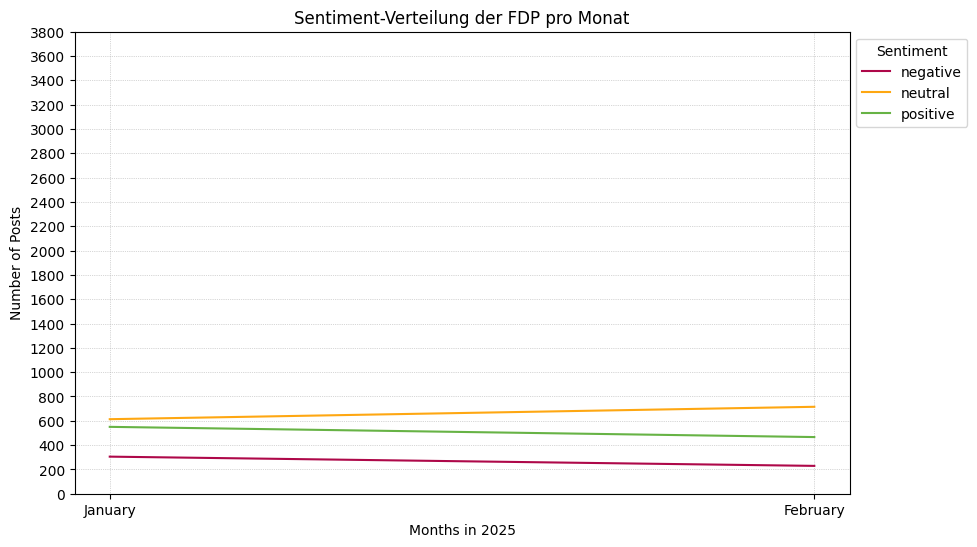

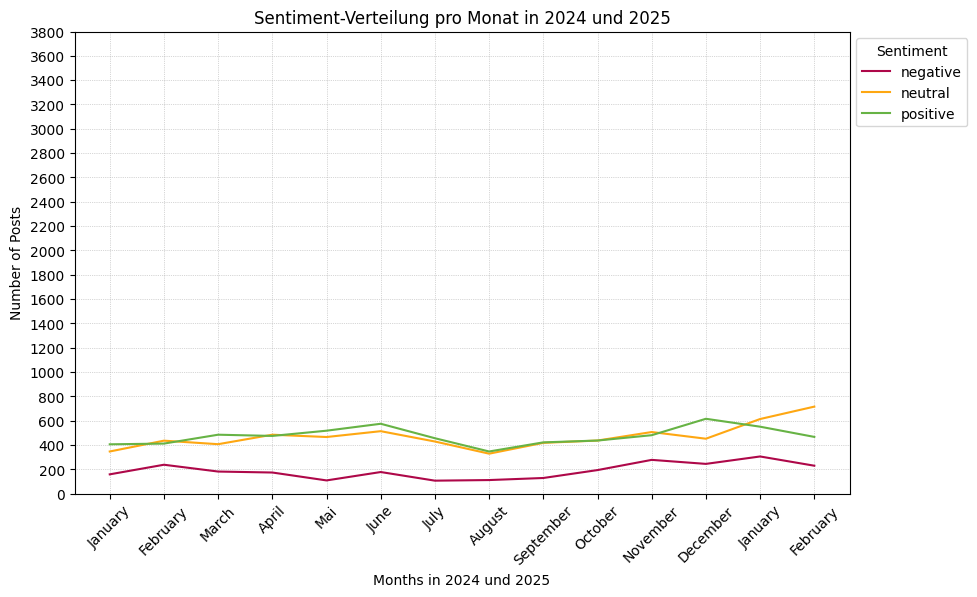

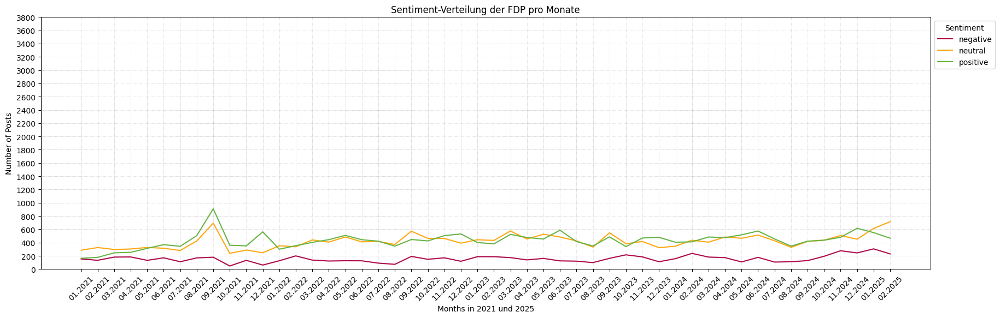

In [30]:
graph_jahr(fdp_Jahr_2021, "Sentiment-Verteilung der FDP pro Monat", 2021)
graph_jahr(fdp_Jahr_2022, "Sentiment-Verteilung der FDP pro Monat", 2022)
graph_jahr(fdp_Jahr_2023, "Sentiment-Verteilung der FDP pro Monat", 2023)
graph_jahr(fdp_Jahr_2024, "Sentiment-Verteilung der FDP pro Monat", 2024)

graph_2025(fdp_Jahr_2025, "Sentiment-Verteilung der FDP pro Monat")
graph_2024_25(fdp_Jahr_2024, fdp_Jahr_2025, "Sentiment-Verteilung pro Monat in 2024 und 2025")
long_graph(fdp_vertical_concat, "Sentiment-Verteilung der FDP pro Monate")

## fraktionslos

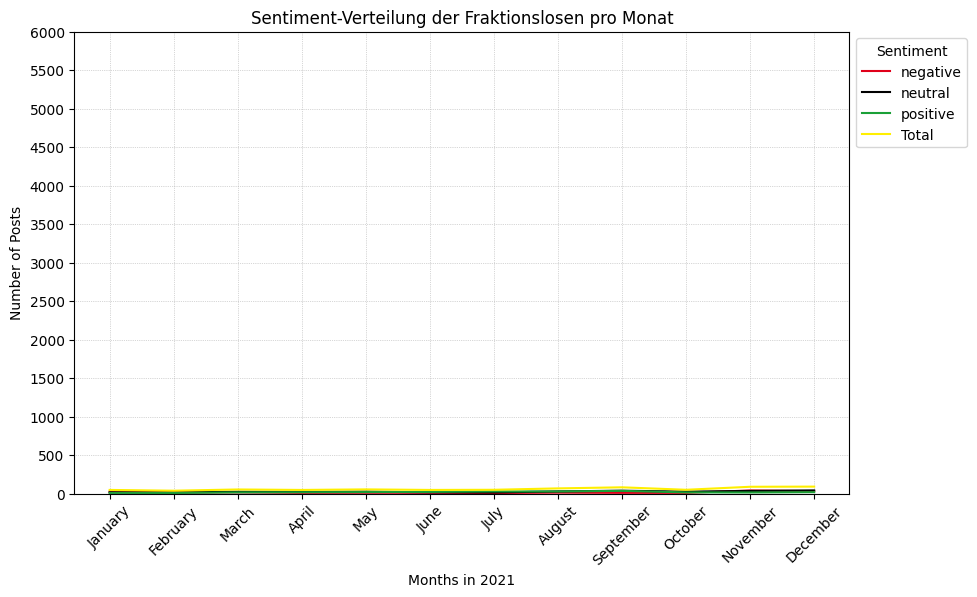

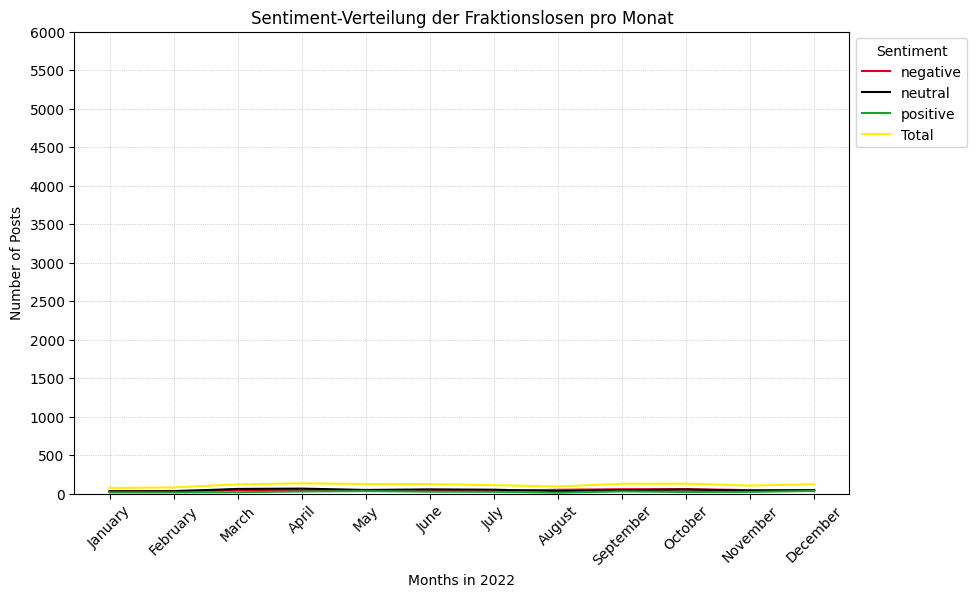

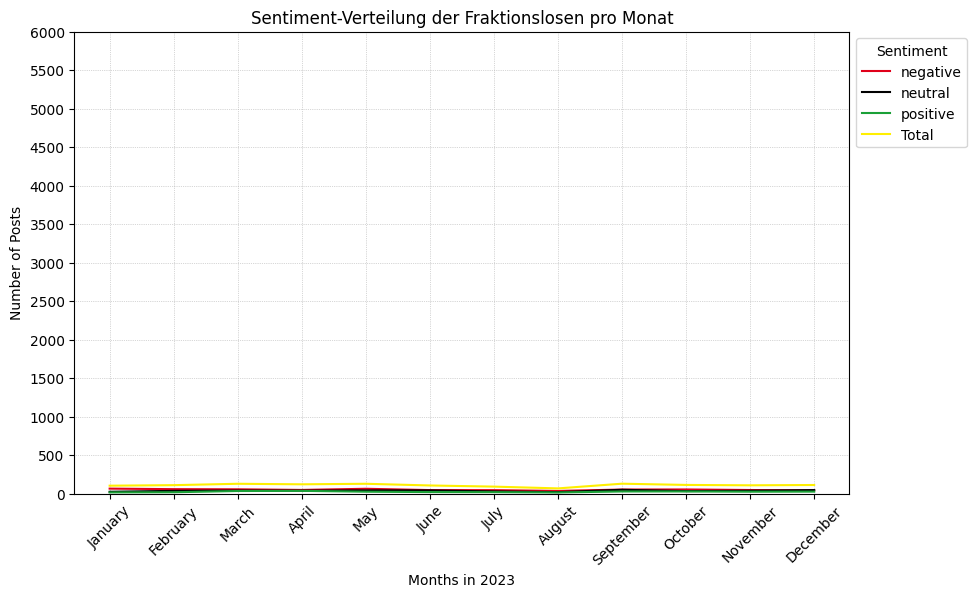

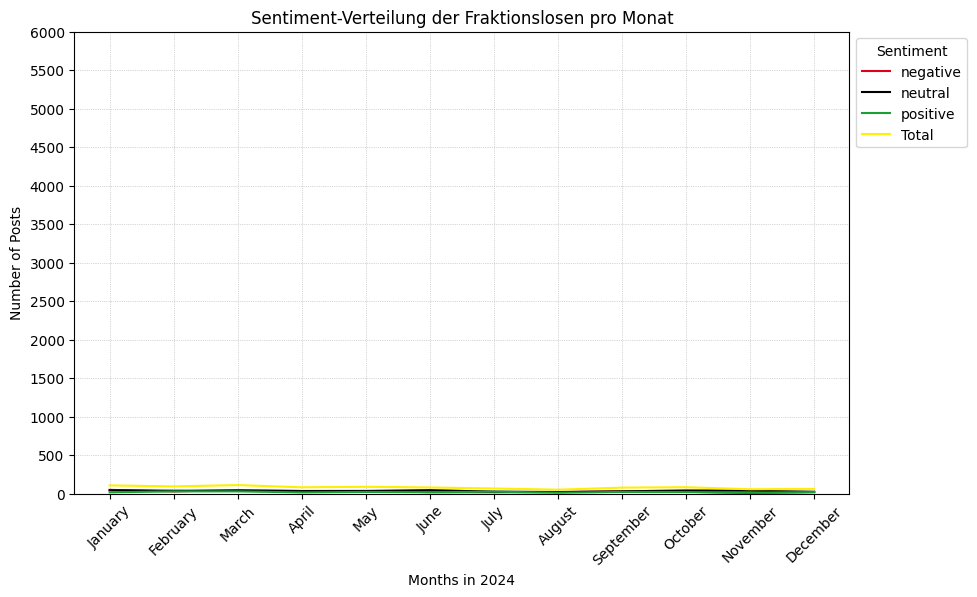

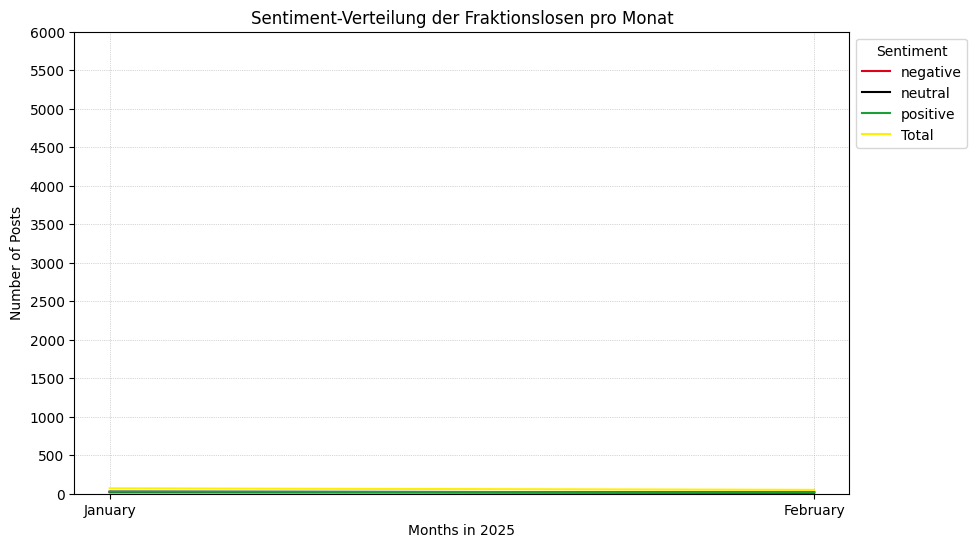

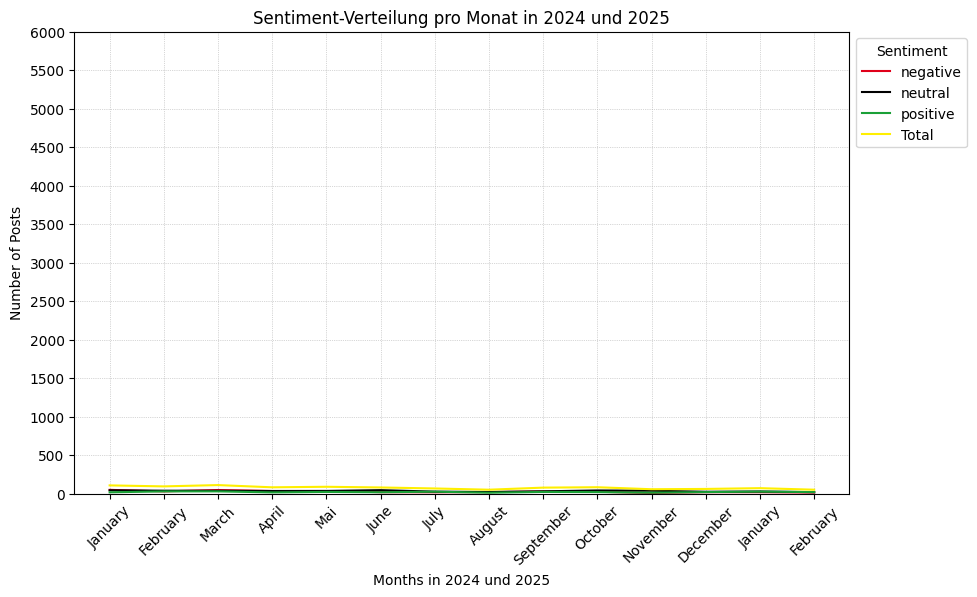

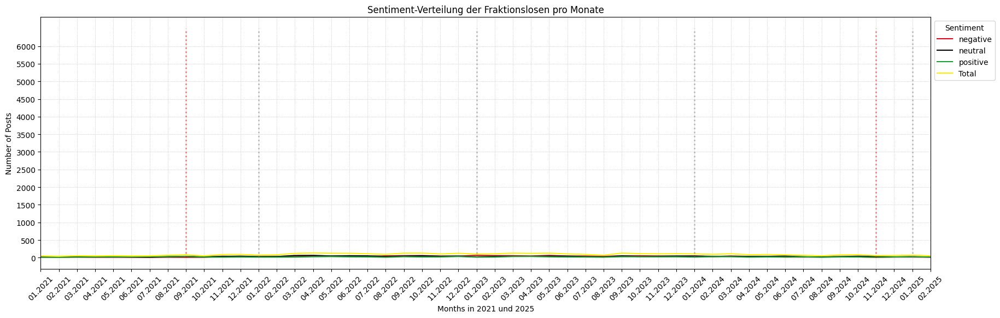

In [62]:
graph_jahr(f_Jahr_2021, "Sentiment-Verteilung der Fraktionslosen pro Monat", 2021)
graph_jahr(f_Jahr_2022, "Sentiment-Verteilung der Fraktionslosen pro Monat", 2022)
graph_jahr(f_Jahr_2023, "Sentiment-Verteilung der Fraktionslosen pro Monat", 2023)
graph_jahr(f_Jahr_2024, "Sentiment-Verteilung der Fraktionslosen pro Monat", 2024)

graph_2025(f_Jahr_2025, "Sentiment-Verteilung der Fraktionslosen pro Monat")

graph_2024_25(f_Jahr_2024, f_Jahr_2025, "Sentiment-Verteilung pro Monat in 2024 und 2025")
long_graph(f_vertical_concat, "Sentiment-Verteilung der Fraktionslosen pro Monate")

## Mean-Sentiment for every party

Calculating the mean-sentiment for every party

In [63]:
gruene_sentiment_counts["Grüne"] = gruene_sentiment_counts.apply(lambda row: Zwischenwert(row), axis=1)
afd_sentiment_counts["AfD"] = afd_sentiment_counts.apply(lambda row: Zwischenwert(row), axis=1)
cdu_sentiment_counts["CDU"] = cdu_sentiment_counts.apply(lambda row: Zwischenwert(row), axis=1)
csu_sentiment_counts["CSU"] = csu_sentiment_counts.apply(lambda row: Zwischenwert(row), axis=1)
cdu_csu_sentiment_counts["CDU/CSU"] = cdu_csu_sentiment_counts.apply(lambda row: Zwischenwert(row), axis=1)
linke_sentiment_counts["Linke"] = linke_sentiment_counts.apply(lambda row: Zwischenwert(row), axis=1)
fdp_sentiment_counts["FDP"] = fdp_sentiment_counts.apply(lambda row: Zwischenwert(row), axis=1)
spd_sentiment_counts["SPD"] = spd_sentiment_counts.apply(lambda row: Zwischenwert(row), axis=1)
f_sentiment_counts["Fraktionslos"] = f_sentiment_counts.apply(lambda row: Zwischenwert(row), axis=1)
bsw_sentiment_counts["BSW"] = bsw_sentiment_counts.apply(lambda row: Zwischenwert(row), axis=1)

Creating two dataframes containing only the mean-sentiment of every party

In [64]:
vertical_sentiment_concat = pd.concat([spd_sentiment_counts["SPD"], cdu_sentiment_counts["CDU"], gruene_sentiment_counts["Grüne"], fdp_sentiment_counts["FDP"] ,afd_sentiment_counts["AfD"], csu_sentiment_counts["CSU"], linke_sentiment_counts["Linke"], f_sentiment_counts["Fraktionslos"], bsw_sentiment_counts["BSW"]], axis=1, ignore_index=True)
vertical_sentiment_concat.columns=["SPD", "CDU", "Grüne", "FDP", "AfD", "CSU", "Linke", "Fraktionslos", "BSW"]

In [ ]:
#the second dataframe combines the CDU and CSU
df_cdu_csu = pd.concat([spd_sentiment_counts["SPD"], cdu_csu_sentiment_counts["CDU/CSU"], gruene_sentiment_counts["Grüne"], fdp_sentiment_counts["FDP"] ,afd_sentiment_counts["AfD"],  linke_sentiment_counts["Linke"], f_sentiment_counts["Fraktionslos"], bsw_sentiment_counts["BSW"]], axis=1, ignore_index=True)
df_cdu_csu.columns=["SPD", "CDU/CSU", "Grüne", "FDP", "AfD", "Linke", "Fraktionslos", "BSW"]

Creating year specific dataframes

In [66]:
parteien_2021 = vertical_sentiment_concat.loc[2021]
parteien_2022 = vertical_sentiment_concat.loc[2022]
parteien_2023 = vertical_sentiment_concat.loc[2023]
parteien_2024 = vertical_sentiment_concat.loc[2024]
parteien_2025 = vertical_sentiment_concat.loc[2025]

parteien_2021_cdu_csu = df_cdu_csu.loc[2021]
parteien_2022_cdu_csu = df_cdu_csu.loc[2022]
parteien_2023_cdu_csu = df_cdu_csu.loc[2023]
parteien_2024_cdu_csu = df_cdu_csu.loc[2024]
parteien_2025_cdu_csu = df_cdu_csu.loc[2025]

parteien_vertical_concat = pd.concat([parteien_2021, 
                                      parteien_2022, 
                                      parteien_2023, 
                                      parteien_2024, 
                                      parteien_2025], axis=0, ignore_index=True)
parteien_vertical_concat_cdu_csu = pd.concat([parteien_2021_cdu_csu,
                                               parteien_2022_cdu_csu, parteien_2023_cdu_csu, parteien_2024_cdu_csu, parteien_2025_cdu_csu], axis=0, ignore_index=True)

parteien_2024_25_cdu_csu = pd.concat([ parteien_2024_cdu_csu, parteien_2025_cdu_csu], axis=0, ignore_index=True)

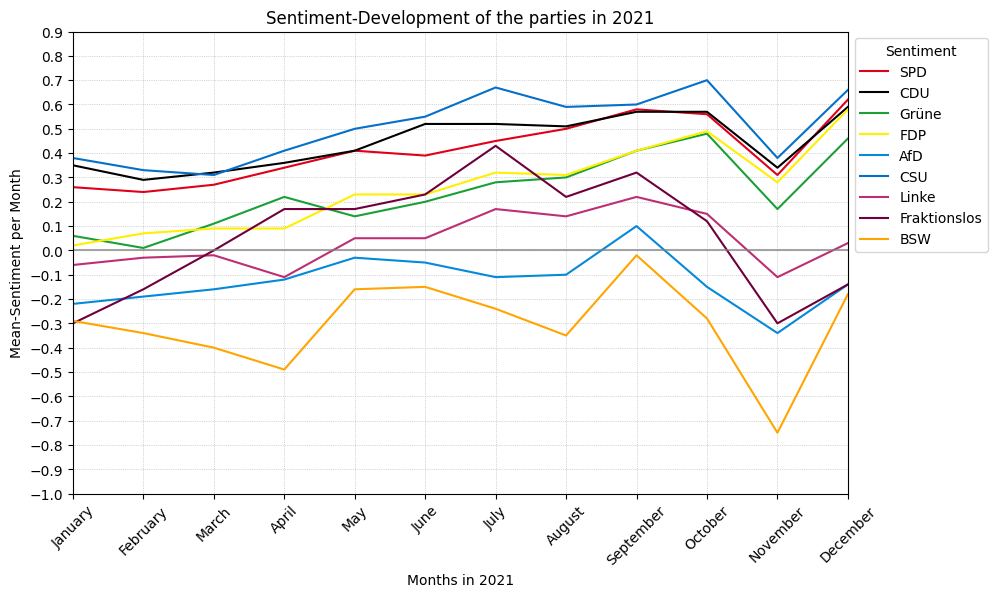

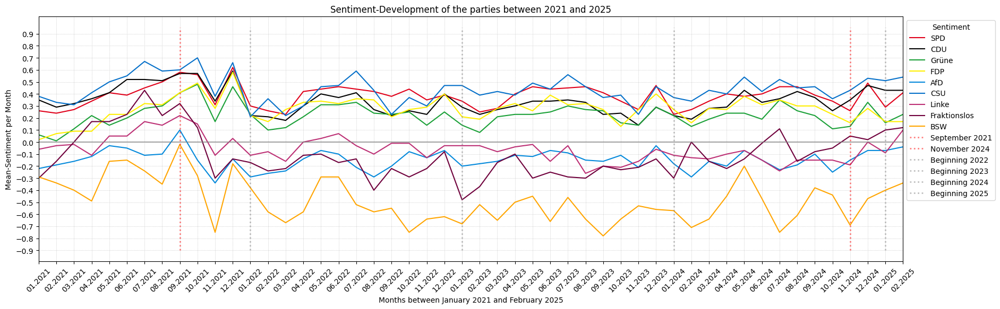

In [67]:
graph_jahr_parteien(parteien_2021, "Sentiment-Development of the parties in 2021", 2021, custom_colors_parteien)
long_graph_parteien(parteien_vertical_concat, "Sentiment-Development of the parties between 2021 and 2025", custom_colors_parteien)

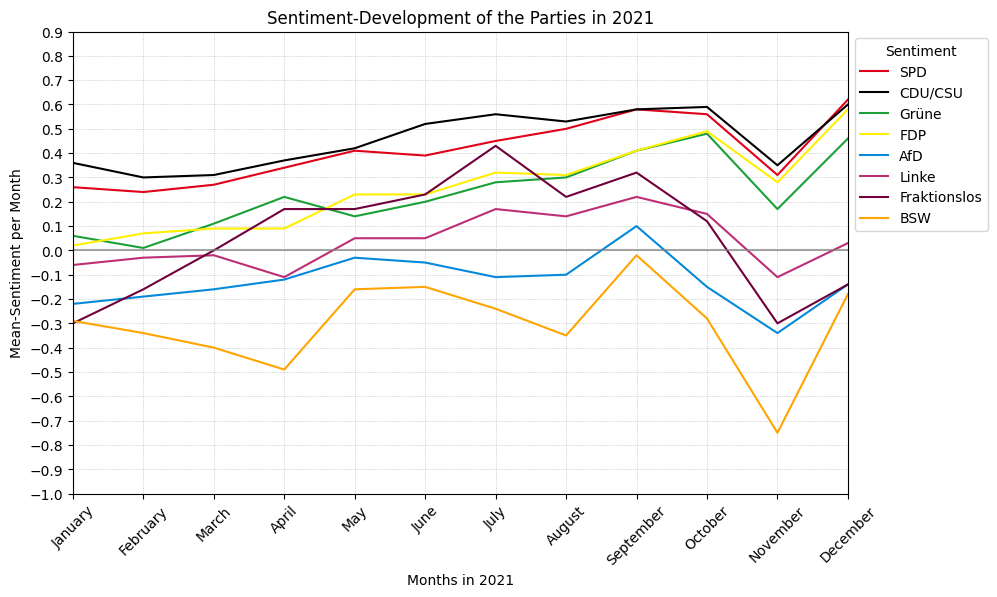

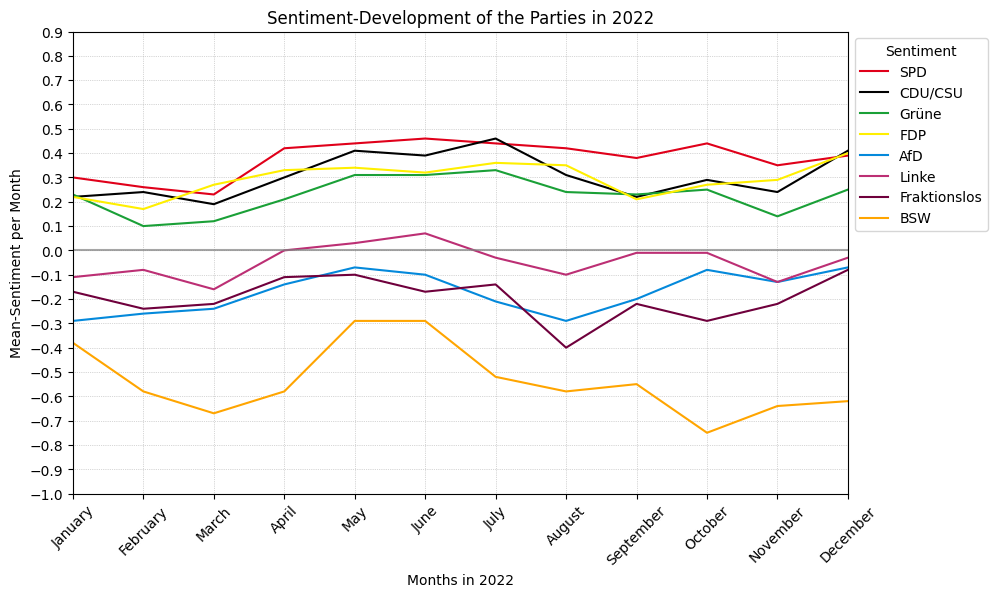

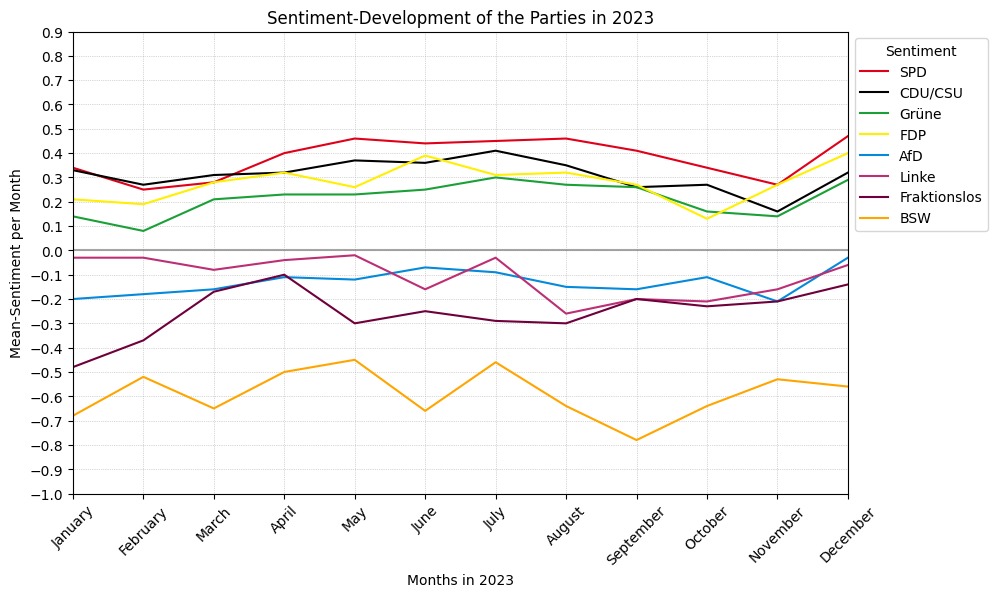

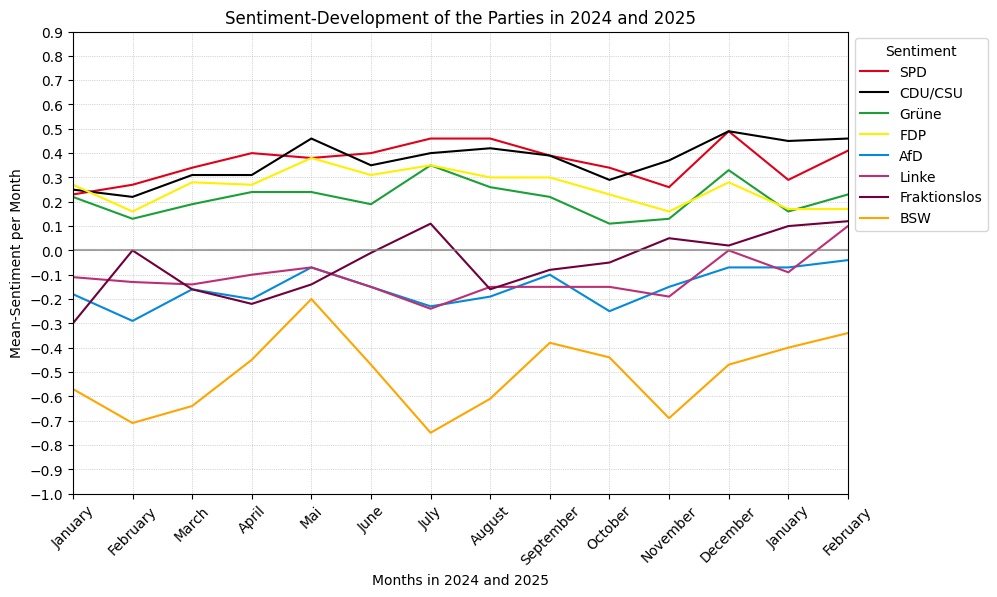

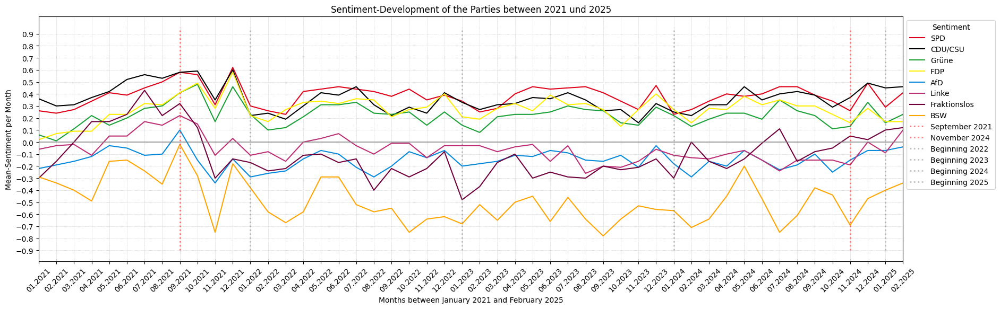

In [68]:
graph_jahr_parteien(parteien_2021_cdu_csu, "Sentiment-Development of the Parties in 2021", 2021, custom_colors_parteien_cdu_csu)
graph_jahr_parteien(parteien_2022_cdu_csu, "Sentiment-Development of the Parties in 2022", 2022, custom_colors_parteien_cdu_csu)
graph_jahr_parteien(parteien_2023_cdu_csu, "Sentiment-Development of the Parties in 2023", 2023, custom_colors_parteien_cdu_csu)
graph_2024_2025_parteien(parteien_2024_25_cdu_csu, "Sentiment-Development of the Parties in 2024 and 2025", custom_colors_parteien_cdu_csu)
long_graph_parteien(parteien_vertical_concat_cdu_csu, "Sentiment-Development of the Parties between 2021 und 2025", custom_colors_parteien_cdu_csu)

### Ampelbruch as mean-sentiment of every party

Creating the relevant dataframes

In [23]:
gruene_sentiment_counts_per_day = gruene.groupby(["Jahr", "Monat", "Tag", "Sentiment"]).size().unstack(fill_value=0)
gruene_sentiment_counts_per_day["Total"] = gruene_sentiment_counts_per_day.sum(axis=1)

spd_sentiment_counts_per_day = spd.groupby(["Jahr", "Monat", "Tag", "Sentiment"]).size().unstack(fill_value=0)
spd_sentiment_counts_per_day["Total"] = spd_sentiment_counts_per_day.sum(axis=1)

cdu_csu_sentiment_counts_per_day = cdu_csu.groupby(["Jahr", "Monat", "Tag", "Sentiment"]).size().unstack(fill_value=0)
cdu_csu_sentiment_counts_per_day["Total"] = cdu_csu_sentiment_counts_per_day.sum(axis=1)

fdp_sentiment_counts_per_day = fdp.groupby(["Jahr", "Monat", "Tag", "Sentiment"]).size().unstack(fill_value=0)
fdp_sentiment_counts_per_day["Total"] = fdp_sentiment_counts_per_day.sum(axis=1)

afd_sentiment_counts_per_day = afd.groupby(["Jahr", "Monat", "Tag", "Sentiment"]).size().unstack(fill_value=0)
afd_sentiment_counts_per_day["Total"] = afd_sentiment_counts_per_day.sum(axis=1)

linke_sentiment_counts_per_day = linke.groupby(["Jahr", "Monat", "Tag", "Sentiment"]).size().unstack(fill_value=0)
linke_sentiment_counts_per_day["Total"] = linke_sentiment_counts_per_day.sum(axis=1)

fraktionslos_sentiment_counts_per_day = fraktionslos.groupby(["Jahr", "Monat", "Tag", "Sentiment"]).size().unstack(fill_value=0)
fraktionslos_sentiment_counts_per_day["Total"] = fraktionslos_sentiment_counts_per_day.sum(axis=1)

bsw_sentiment_counts_per_day = bsw.groupby(["Jahr", "Monat", "Tag", "Sentiment"]).size().unstack(fill_value=0)
bsw_sentiment_counts_per_day["Total"] = bsw_sentiment_counts_per_day.sum(axis=1)

csu_sentiment_counts_per_day = csu.groupby(["Jahr", "Monat", "Tag", "Sentiment"]).size().unstack(fill_value=0)
csu_sentiment_counts_per_day["Total"] = csu_sentiment_counts_per_day.sum(axis=1)

cdu_sentiment_counts_per_day = cdu.groupby(["Jahr", "Monat", "Tag", "Sentiment"]).size().unstack(fill_value=0)
cdu_sentiment_counts_per_day["Total"] = cdu_sentiment_counts_per_day.sum(axis=1)    


Filtering the relevant years

In [24]:
gruene_grouped_24 = gruene_sentiment_counts_per_day.groupby(level='Jahr')
gruene_dfs = {year: group for year, group in gruene_grouped_24}
gruene_J2024 = gruene_dfs [2024]
gruene_J2024.index = gruene_J2024.index.droplevel(0)
gruene_J2025 = gruene_dfs [2025]
gruene_J2025.index = gruene_J2025.index.droplevel(0)


spd_grouped_24 = spd_sentiment_counts_per_day.groupby(level='Jahr')
spd_dfs = {year: group for year, group in spd_grouped_24}
spd_J2024 = spd_dfs [2024]
spd_J2024.index = spd_J2024.index.droplevel(0)
spd_J2025 = spd_dfs [2025]
spd_J2025.index = spd_J2025.index.droplevel(0)


cdu_grouped_24 = cdu_sentiment_counts_per_day.groupby(level='Jahr')
cdu_dfs = {year: group for year, group in cdu_grouped_24}
cdu_J2024 = cdu_dfs [2024]
cdu_J2024.index = cdu_J2024.index.droplevel(0)
cdu_J2025 = cdu_dfs [2025]
cdu_J2025.index = cdu_J2025.index.droplevel(0)


csu_grouped_24 = csu_sentiment_counts_per_day.groupby(level='Jahr')
csu_dfs = {year: group for year, group in csu_grouped_24}
csu_J2024 = csu_dfs [2024]
csu_J2024.index = csu_J2024.index.droplevel(0)
csu_J2025 = csu_dfs [2025]
csu_J2025.index = csu_J2025.index.droplevel(0)


cdu_csu_grouped_24 = cdu_csu_sentiment_counts_per_day.groupby(level='Jahr')
cdu_csu_dfs = {year: group for year, group in cdu_csu_grouped_24}
cdu_csu_J2024 = cdu_csu_dfs [2024]
cdu_csu_J2024.index = cdu_csu_J2024.index.droplevel(0)
cdu_csu_J2025 = cdu_csu_dfs [2025]
cdu_csu_J2025.index = cdu_csu_J2025.index.droplevel(0)


fdp_grouped_24 = fdp_sentiment_counts_per_day.groupby(level='Jahr')
fdp_dfs = {year: group for year, group in fdp_grouped_24}
fdp_J2024 = fdp_dfs [2024]
fdp_J2024.index = fdp_J2024.index.droplevel(0)
fdp_J2025 = fdp_dfs [2025]
fdp_J2025.index = fdp_J2025.index.droplevel(0)


afd_grouped_24 = afd_sentiment_counts_per_day.groupby(level='Jahr')
afd_dfs = {year: group for year, group in afd_grouped_24}
afd_J2024 = afd_dfs [2024]
afd_J2024.index = afd_J2024.index.droplevel(0)
afd_J2025 = afd_dfs [2025]
afd_J2025.index = afd_J2025.index.droplevel(0)


linke_grouped_24 = linke_sentiment_counts_per_day.groupby(level='Jahr')
linke_dfs = {year: group for year, group in linke_grouped_24}
linke_J2024 = linke_dfs [2024]
linke_J2024.index = linke_J2024.index.droplevel(0)
linke_J2025 = linke_dfs [2025]
linke_J2025.index = linke_J2025.index.droplevel(0)


fraktionslos_grouped_24 = fraktionslos_sentiment_counts_per_day.groupby(level='Jahr')
fraktionslos_dfs = {year: group for year, group in cdu_grouped_24}
fraktionslos_J2024 = fraktionslos_dfs [2024]
fraktionslos_J2024.index = fraktionslos_J2024.index.droplevel(0)
fraktionslos_J2025 = fraktionslos_dfs [2025]
fraktionslos_J2025.index = fraktionslos_J2025.index.droplevel(0)


bsw_grouped_24 = bsw_sentiment_counts_per_day.groupby(level='Jahr')
bsw_dfs = {year: group for year, group in bsw_grouped_24}
bsw_J2024 = bsw_dfs [2024]
bsw_J2024.index = bsw_J2024.index.droplevel(0)
bsw_J2025 = bsw_dfs [2025]
bsw_J2025.index = bsw_J2025.index.droplevel(0)

Calculating the mean-sentiment

In [25]:
gruene_J2024["Grüne"] = gruene_J2024.apply(lambda row: Zwischenwert(row), axis=1)
afd_J2024["AfD"] = afd_J2024.apply(lambda row: Zwischenwert(row), axis=1)
cdu_J2024["CDU"] = cdu_J2024.apply(lambda row: Zwischenwert(row), axis=1)
csu_J2024["CSU"] = csu_J2024.apply(lambda row: Zwischenwert(row), axis=1)
cdu_csu_J2024["CDU/CSU"] = cdu_csu_J2024.apply(lambda row: Zwischenwert(row), axis=1)
linke_J2024["Linke"] = linke_J2024.apply(lambda row: Zwischenwert(row), axis=1)
fdp_J2024["FDP"] = fdp_J2024.apply(lambda row: Zwischenwert(row), axis=1)
spd_J2024["SPD"] = spd_J2024.apply(lambda row: Zwischenwert(row), axis=1)
fraktionslos_J2024["Fraktionslos"] = fraktionslos_J2024.apply(lambda row: Zwischenwert(row), axis=1)
bsw_J2024["BSW"] = bsw_J2024.apply(lambda row: Zwischenwert(row), axis=1)

gruene_J2025["Grüne"] = gruene_J2025.apply(lambda row: Zwischenwert(row), axis=1)
afd_J2025["AfD"] = afd_J2025.apply(lambda row: Zwischenwert(row), axis=1)
cdu_J2025["CDU"] = cdu_J2025.apply(lambda row: Zwischenwert(row), axis=1)
csu_J2025["CSU"] = csu_J2025.apply(lambda row: Zwischenwert(row), axis=1)
cdu_csu_J2025["CDU/CSU"] = cdu_csu_J2025.apply(lambda row: Zwischenwert(row), axis=1)
linke_J2025["Linke"] = linke_J2025.apply(lambda row: Zwischenwert(row), axis=1)
fdp_J2025["FDP"] = fdp_J2025.apply(lambda row: Zwischenwert(row), axis=1)
spd_J2025["SPD"] = spd_J2025.apply(lambda row: Zwischenwert(row), axis=1)
fraktionslos_J2025["Fraktionslos"] = fraktionslos_J2025.apply(lambda row: Zwischenwert(row), axis=1)
bsw_J2025["BSW"] = bsw_J2025.apply(lambda row: Zwischenwert(row), axis=1)

Creating dataframes containing only the mean-sentiment of each party

In [26]:
df_cdu_csu_24 = pd.concat([spd_J2024["SPD"], cdu_csu_J2024["CDU/CSU"], gruene_J2024["Grüne"], fdp_J2024["FDP"] ,afd_J2024["AfD"],  linke_J2024["Linke"], fraktionslos_J2024["Fraktionslos"], bsw_J2024["BSW"]], axis=1, ignore_index=True)
df_cdu_csu_24.columns=["SPD", "CDU/CSU", "Grüne", "FDP", "AfD", "Linke", "Fraktionslos", "BSW"]

df_cdu_csu_25 = pd.concat([spd_J2025["SPD"], cdu_csu_J2025["CDU/CSU"], gruene_J2025["Grüne"], fdp_J2025["FDP"] ,afd_J2025["AfD"],  linke_J2025["Linke"], fraktionslos_J2025["Fraktionslos"], bsw_J2025["BSW"]], axis=1, ignore_index=True)
df_cdu_csu_25.columns=["SPD", "CDU/CSU", "Grüne", "FDP", "AfD", "Linke", "Fraktionslos", "BSW"]

Filtering the relevant months

In [27]:
september_J2024 =  df_cdu_csu_24.loc[9.0]
oktober_J2024 =  df_cdu_csu_24.loc[10.0]
november_J2024 =  df_cdu_csu_24.loc[11.0]
dezember_J2024 =  df_cdu_csu_24.loc[12.0]
januar_J2025 =  df_cdu_csu_25.loc[1.0]

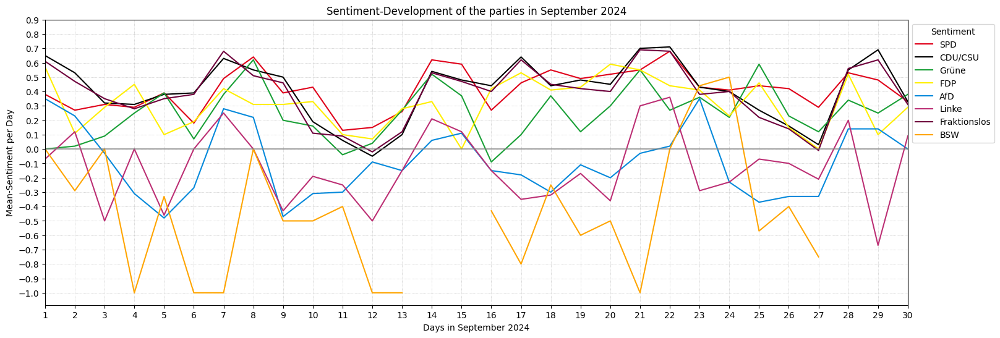

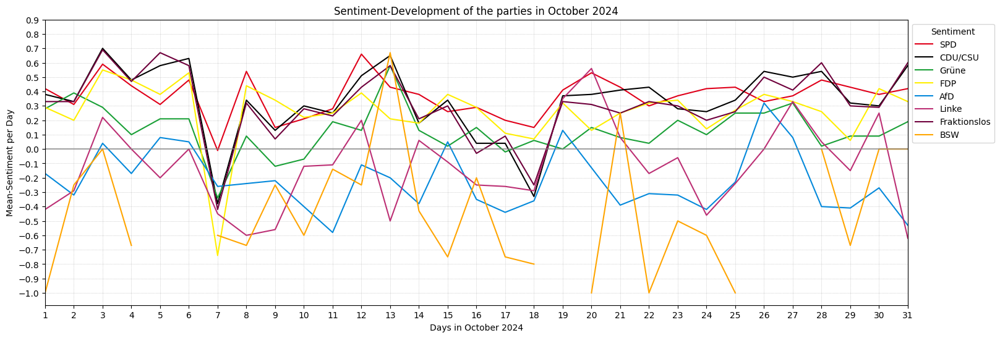

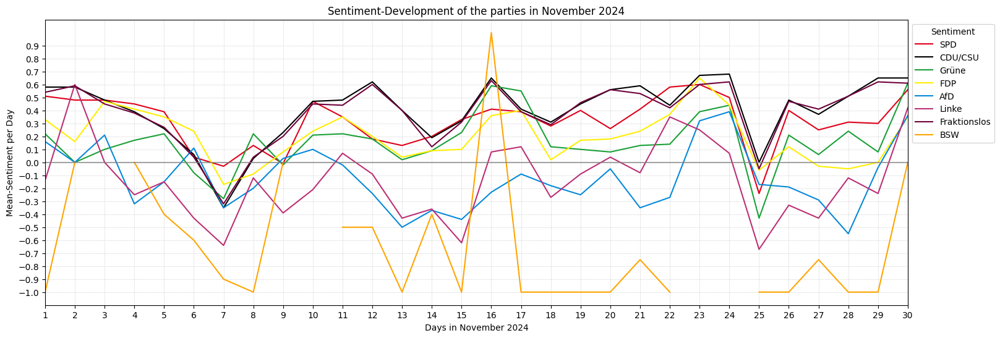

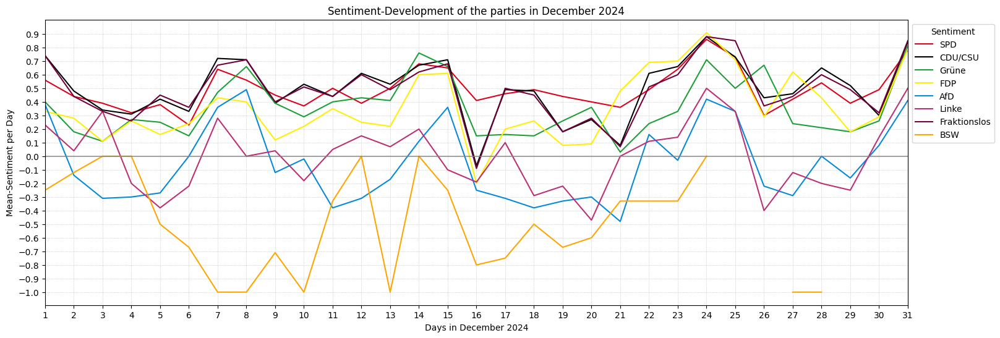

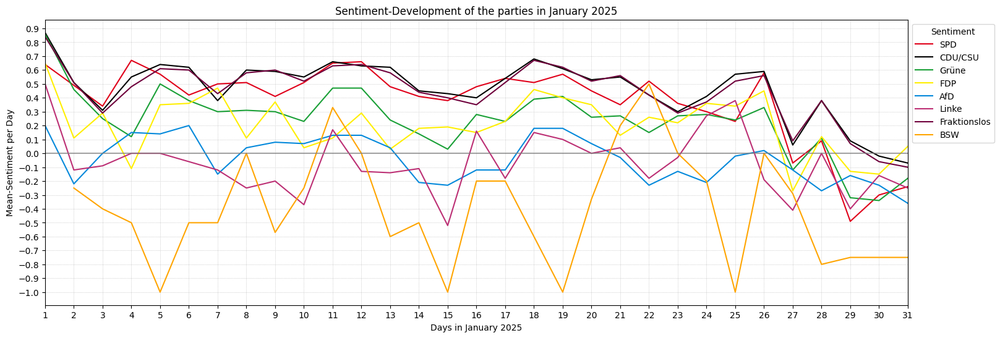

In [31]:
tage_im_monat(september_J2024, "Sentiment-Development of the parties in September 2024", "September", 2024, tage_30, custom_colors_parteien_cdu_csu, 30)
tage_im_monat(oktober_J2024, "Sentiment-Development of the parties in October 2024", "October", 2024, tage_31, custom_colors_parteien_cdu_csu, 31)
tage_im_monat(november_J2024, "Sentiment-Development of the parties in November 2024", "November", 2024, tage_30, custom_colors_parteien_cdu_csu, 30)
tage_im_monat(dezember_J2024, "Sentiment-Development of the parties in December 2024", "December", 2024, tage_31, custom_colors_parteien_cdu_csu, 31)
tage_im_monat(januar_J2025, "Sentiment-Development of the parties in January 2025", "January", 2025, tage_31, custom_colors_parteien_cdu_csu, 31)

Creating a big overview graphic of the relevant months

In [ ]:
df_ampelbruch = df_cdu_csu_24.loc[ [9.0, 10.0, 11.0, 12.0] ]

SPD  CDU/CSU  Grüne   FDP   AfD  Linke  Fraktionslos   BSW
Monat Tag                                                              
9.0   1.0   0.38     0.65   0.00  0.57  0.35  -0.07          0.61  0.00
      2.0   0.27     0.53   0.02  0.11  0.23   0.12          0.47 -0.29
      3.0   0.31     0.32   0.09  0.29 -0.03  -0.50          0.35  0.00
      4.0   0.29     0.31   0.25  0.45 -0.31   0.00          0.28 -1.00
      5.0   0.39     0.38   0.39  0.10 -0.48  -0.46          0.35 -0.33
...          ...      ...    ...   ...   ...    ...           ...   ...
12.0  27.0  0.42     0.46   0.24  0.62 -0.29  -0.12          0.44 -1.00
      28.0  0.54     0.65   0.21  0.43  0.00  -0.20          0.60 -1.00
      29.0  0.39     0.52   0.18  0.18 -0.16  -0.25          0.49   NaN
      30.0  0.49     0.30   0.26  0.29  0.08   0.14          0.32 -1.00
      31.0  0.78     0.84   0.81  0.79  0.41   0.50          0.85   NaN

[122 rows x 8 columns]

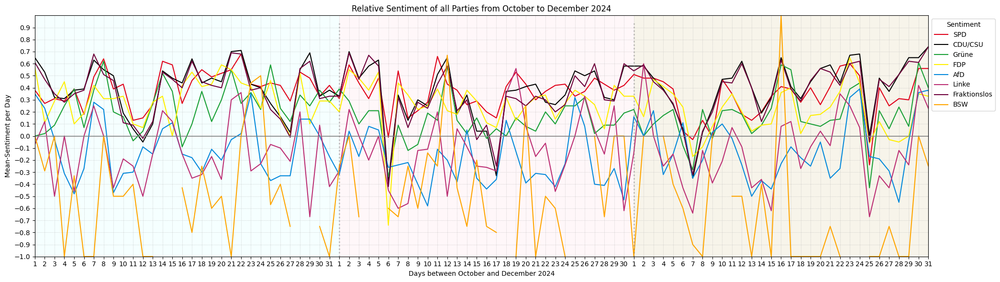

In [33]:
Ampelbruch(df_ampelbruch)

Percentage of Sentiment for each party

In [34]:
sentiment_je_partei = df2.groupby(["Fraktion oder Gruppe (Partei)", "Sentiment"]).size()
sentiment_dict = {}

sentiment_dict["Grüne"] = sentiment_je_partei["Grüne"].to_dict()
sentiment_dict["AfD"] = sentiment_je_partei["AfD"].to_dict()
sentiment_dict["BSW"] = sentiment_je_partei["Grüne"].to_dict()
sentiment_dict["CDU/CSU"] = sentiment_je_partei["CDU/CSU"].to_dict()
sentiment_dict["Die Linke"] = sentiment_je_partei["Die Linke"].to_dict()
sentiment_dict["FDP"] = sentiment_je_partei["FDP"].to_dict()
sentiment_dict["SPD"] = sentiment_je_partei["SPD"].to_dict()
sentiment_dict["Fraktionslos"] = sentiment_je_partei["fraktionslos"].to_dict()

In [58]:
sentiment_je_partei_df = pd.DataFrame(sentiment_dict)

sentiment_je_partei_df = sentiment_je_partei_df.transpose()
sentiment_je_partei_df["Total"] = sentiment_je_partei_df.sum(axis=1)

Calculating the percentage

In [59]:
sentiment_je_partei_df["rel_negativ"] = round(sentiment_je_partei_df["negative"]/(sentiment_je_partei_df["Total"]* 0.01 ), 1)
sentiment_je_partei_df["rel_neutral"] = round(sentiment_je_partei_df["neutral"]/(sentiment_je_partei_df["Total"]* 0.01 ), 1)
sentiment_je_partei_df["rel_positiv"] = round(sentiment_je_partei_df["positive"]/(sentiment_je_partei_df["Total"]* 0.01 ), 1)

In [ ]:
sentiment_je_partei_df = sentiment_je_partei_df.drop(columns=["Total", "negative", "neutral", "positive"])

sentiment_je_partei_df.columns = ["negative", "neutral", "positive"]

Creating the graphic

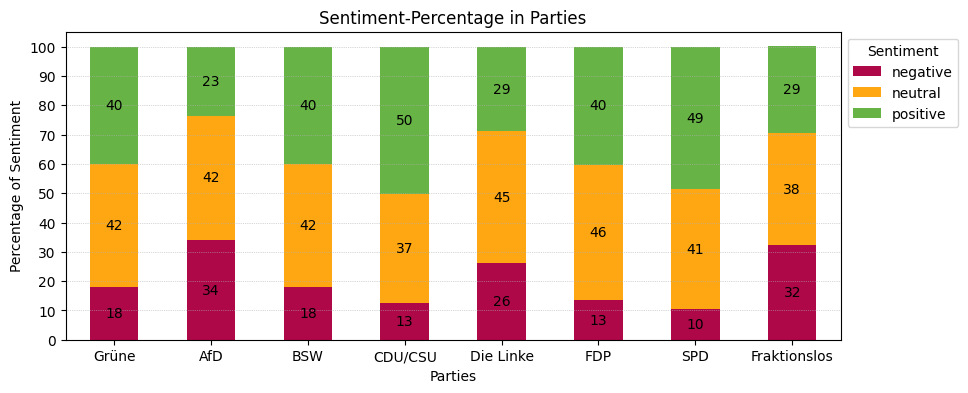

In [61]:
ax = sentiment_je_partei_df.plot(kind="bar", stacked=True, figsize=(10,4), color=custom_colors)

ax.set_xticks(range(len(sentiment_je_partei_df)))
ax.set_xticklabels(sentiment_je_partei_df.index)

ax.set_yticks(range(0, 110, 10))

plt.xlabel("Parties")
plt.ylabel("Percentage of Sentiment")
plt.title("Sentiment-Percentage in Parties")
plt.legend(title="Sentiment", bbox_to_anchor=(1.0, 1), loc='upper left')
plt.xticks(rotation=0)
plt.grid(True, which='both', axis= "y", linestyle=':', linewidth=0.5)

for c in ax.containers:
    labels = [round(v.get_height()) if v.get_height() > 0 else '' for v in c]
    ax.bar_label(c, labels=labels, label_type='center')

plt.savefig('../Outputs/long_graph_parteien/Anteil_Sentiment_Parteien.png', bbox_inches='tight')
plt.show()

Combined number of all posts for every party in the four years

In [ ]:
df_cdu_csu_Jahr_2021 = pd.concat([spd_Jahr_2021["Total"], cdu_csu_Jahr_2021["Total"], g_Jahr_2021["Total"], fdp_Jahr_2021["Total"] ,afd_Jahr_2021["Total"],  l_Jahr_2021["Total"], f_Jahr_2021["Total"], bsw_Jahr_2021["Total"]], axis=1, ignore_index=True)
df_cdu_csu_Jahr_2021.columns=["SPD", "CDU/CSU", "Grüne", "FDP", "AfD", "Linke", "Fraktionslos", "BSW"]

df_cdu_csu_Jahr_2022 = pd.concat([spd_Jahr_2022["Total"], cdu_csu_Jahr_2022["Total"], g_Jahr_2022["Total"], fdp_Jahr_2022["Total"] ,afd_Jahr_2022["Total"],  l_Jahr_2022["Total"], f_Jahr_2022["Total"], bsw_Jahr_2021["Total"]], axis=1, ignore_index=True)
df_cdu_csu_Jahr_2022.columns=["SPD", "CDU/CSU", "Grüne", "FDP", "AfD", "Linke", "Fraktionslos", "BSW"]

df_cdu_csu_Jahr_2023 = pd.concat([spd_Jahr_2023["Total"], cdu_csu_Jahr_2023["Total"], g_Jahr_2023["Total"], fdp_Jahr_2023["Total"] ,afd_Jahr_2023["Total"],  l_Jahr_2023["Total"], f_Jahr_2023["Total"], bsw_Jahr_2023["Total"]], axis=1, ignore_index=True)
df_cdu_csu_Jahr_2023.columns=["SPD", "CDU/CSU", "Grüne", "FDP", "AfD", "Linke", "Fraktionslos", "BSW"]

df_cdu_csu_Jahr_2024 = pd.concat([spd_Jahr_2024["Total"], cdu_csu_Jahr_2024["Total"], g_Jahr_2024["Total"], fdp_Jahr_2024["Total"] ,afd_Jahr_2024["Total"],  l_Jahr_2024["Total"], f_Jahr_2024["Total"], bsw_Jahr_2021["Total"]], axis=1, ignore_index=True)
df_cdu_csu_Jahr_2024.columns=["SPD", "CDU/CSU", "Grüne", "FDP", "AfD", "Linke", "Fraktionslos", "BSW"]

df_cdu_csu_Jahr_2025 = pd.concat([spd_Jahr_2025["Total"], cdu_csu_Jahr_2025["Total"], g_Jahr_2025["Total"], fdp_Jahr_2025["Total"] ,afd_Jahr_2025["Total"],  l_Jahr_2025["Total"], f_Jahr_2025["Total"], bsw_Jahr_2025["Total"]], axis=1, ignore_index=True)
df_cdu_csu_Jahr_2025.columns=["SPD", "CDU/CSU", "Grüne", "FDP", "AfD", "Linke", "Fraktionslos", "BSW"]

df_cdu_csu_vertical_concat = pd.concat([df_cdu_csu_Jahr_2021, df_cdu_csu_Jahr_2022, df_cdu_csu_Jahr_2023, df_cdu_csu_Jahr_2024, df_cdu_csu_Jahr_2025], axis=0, ignore_index=True)

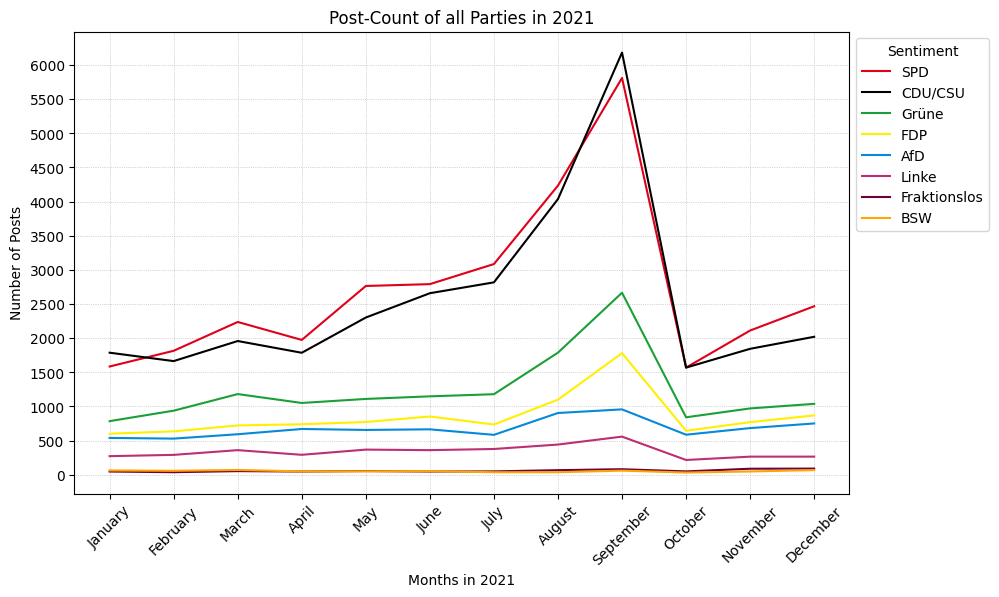

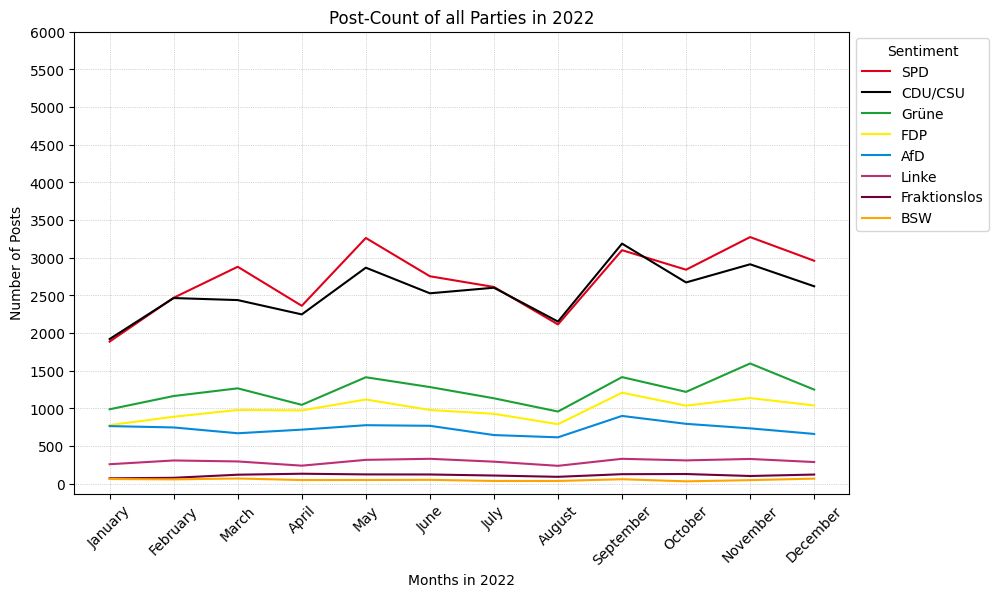

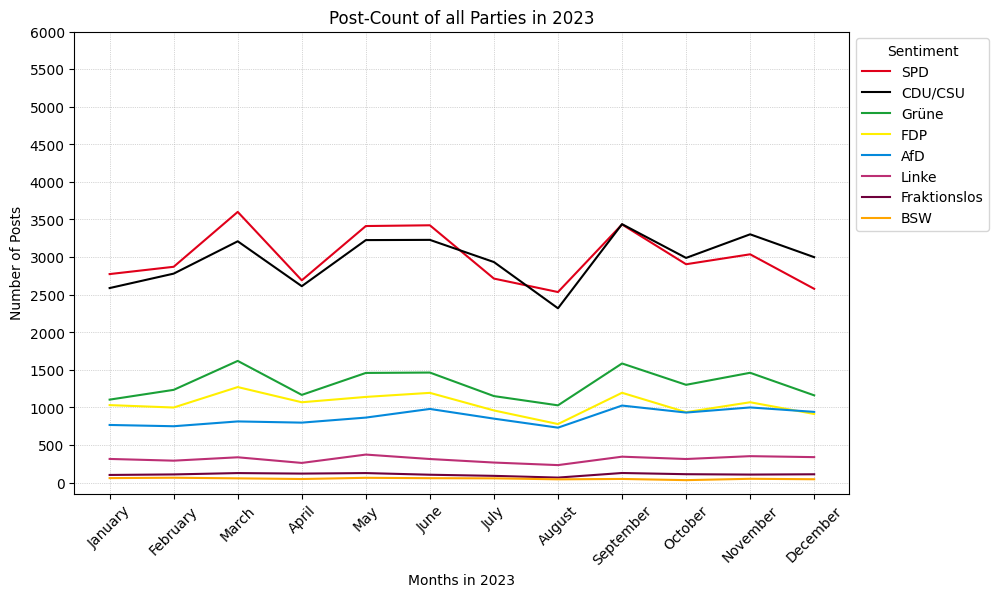

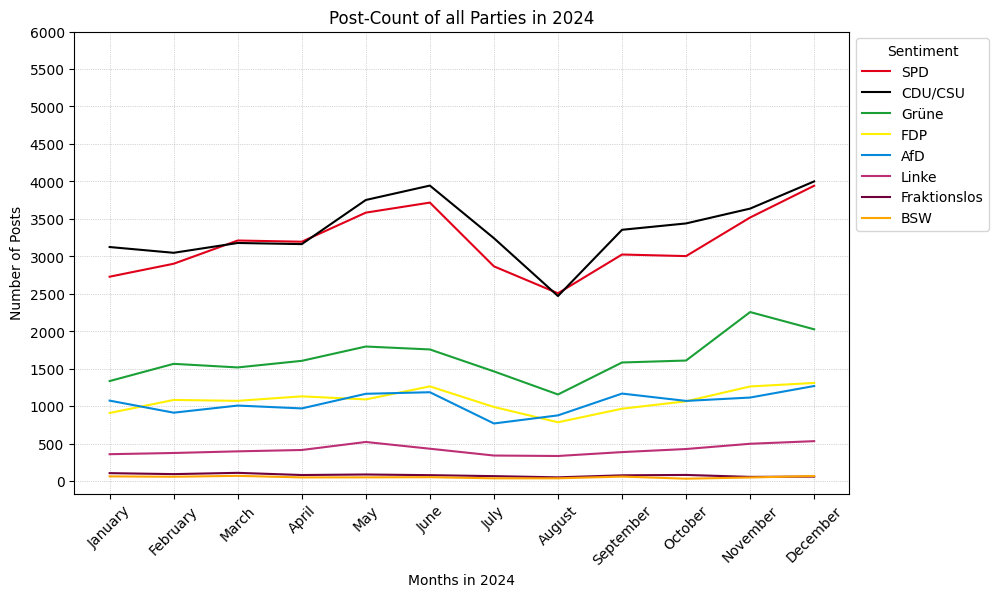

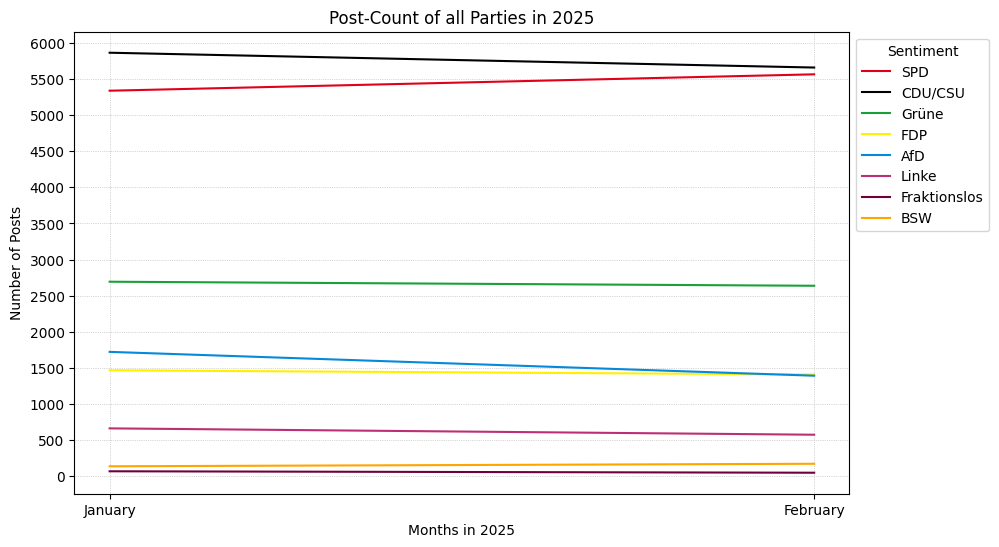

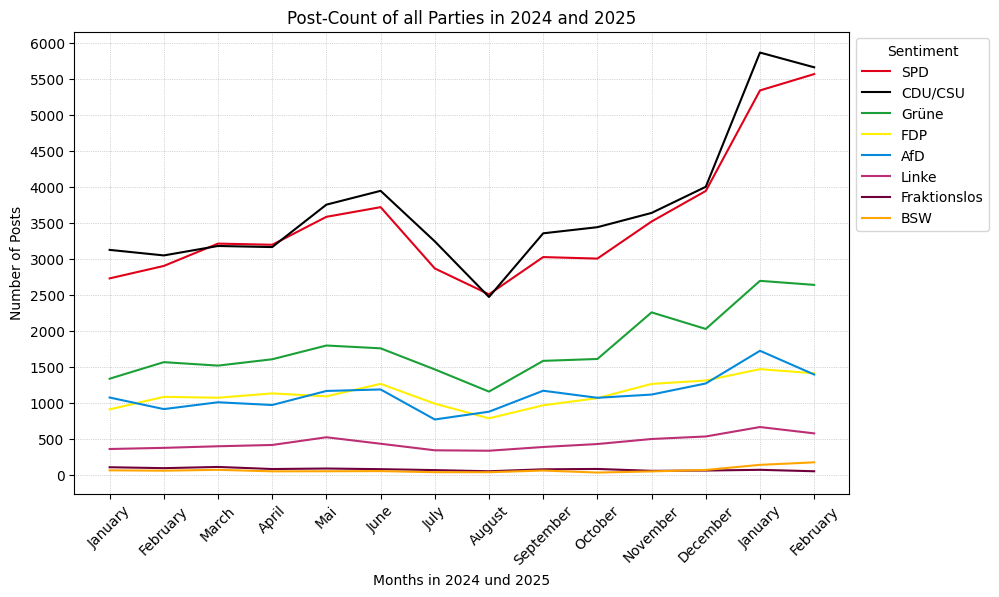

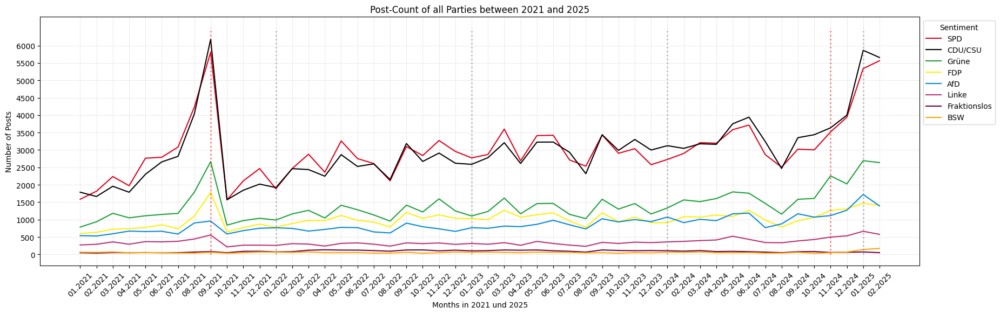

In [50]:
graph_jahr(df_cdu_csu_Jahr_2021, "Post-Count of all Parties in 2021", 2021)
graph_jahr(df_cdu_csu_Jahr_2022, "Post-Count of all Parties in 2022", 2022)
graph_jahr(df_cdu_csu_Jahr_2023, "Post-Count of all Parties in 2023", 2023)
graph_jahr(df_cdu_csu_Jahr_2024, "Post-Count of all Parties in 2024", 2024)
graph_2025(df_cdu_csu_Jahr_2025, "Post-Count of all Parties in 2025")

graph_2024_25(df_cdu_csu_Jahr_2024, df_cdu_csu_Jahr_2025, "Post-Count of all Parties in 2024 and 2025")

long_graph(df_cdu_csu_vertical_concat, "Post-Count of all Parties between 2021 and 2025")